# Age and Gender Prediction Project

## Dataset description:
- UTKFace dataset is a large-scale face dataset with long age span (range from 0 to 116 years old). The dataset consists of over 20,000 face images with annotations of age, gender, and ethnicity. The images cover large variation in pose, facial expression, illumination, occlusion, resolution, etc.
- The images are correspondingly aligned and cropped.
- The labels of each face image is embedded in the file name, formated like [age]__[gender]_[race]_[date&time].jpg
  - [age] is an integer from 0 to 116, indicating the age
  - [gender] is either 0 (male) or 1 (female)
  - [race] is an integer from 0 to 4, denoting White, Black, Asian, Indian, and Others (like Hispanic, Latino, Middle Eastern).
  - [date&time] is in the format of yyyymmddHHMMSSFFF, showing the date and time an image was collected to UTKFace

## Motivation:
- Automating age and gender prediction via image recognition may help in various domains, such as healthcare, social services, marketing, security, education, etc. 

## Objectives:
- Perform dataset inspection, preprocessing, and EDA.
- Create a single model that returns age and gender in a single pass.
- Analyze model performance with the test set.
- Understand, which are the top mispredictions. Plot and analyze them.
- Use LIME for model interpretability with images.

## Biases:
- Some age and race groups are underrepresented.
- There may be some labeling bias and errors.
- Some images are of a bad quality, with markings/drawings, with unusual face positions.
- Some images have invalid labels.

In [1]:
!pip install pytorch_lightning


[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: pip install --upgrade pip


In [879]:
import os
from torchvision import datasets, transforms
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from random import sample
import random
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.dataloader import default_collate
from PIL import Image
import glob
from torch.utils.data import SubsetRandomSampler
from sklearn.preprocessing import OrdinalEncoder

import pytorch_lightning as pl
from torch.nn import functional as F
from torchvision import models
from torch.utils.data import random_split
from joblib import Parallel, delayed
from tqdm import tqdm
import seaborn as sns

from sklearn.model_selection import train_test_split

from torchvision.models import ResNet34_Weights, ResNet18_Weights, ResNet50_Weights
from torchsummary import summary
from torchvision import transforms, models
from torch.optim import lr_scheduler
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
import optuna
import logging
from typing import List, Optional, Tuple
from sklearn.metrics import accuracy_score, f1_score, r2_score, precision_score
from sklearn.metrics import recall_score, mean_absolute_error, mean_squared_error
from sklearn.metrics import roc_auc_score
from torchmetrics import ConfusionMatrix
from sklearn.metrics import classification_report
from pytorch_lightning.callbacks import LearningRateFinder
from lime import lime_image
from skimage.segmentation import mark_boundaries
from skimage.segmentation import slic
from skimage.transform import resize
import pickle

import warnings
warnings.filterwarnings("ignore")

In [277]:
logger = logging.getLogger()
logger.handlers = []
handler = logging.StreamHandler()
formatter = logging.Formatter('%(levelname)s - %(message)s')
handler.setFormatter(formatter)
logger.addHandler(handler)
logger.setLevel(logging.INFO)

In [14]:
data_dir = 'archive/UTKFace/'
data_dir_short = 'archive/crop_part1/'

Let's check the difference between two available folders in this dataset:

In [15]:
folder1_files = set(os.listdir(data_dir))
folder2_files = set(os.listdir(data_dir_short))
print("Num. of files in UTKFace folder:", len(folder1_files))
print("Num. of files in crop_part1 folder:", len(folder2_files))

common_files = folder1_files.intersection(folder2_files)
print("Common files between folders 'crop_part1' and 'UTKFace':", len(common_files))

Num. of files in UTKFace folder: 23707
Num. of files in crop_part1 folder: 9779
Common files between folders 'crop_part1' and 'UTKFace': 9779


We can see that the folder crop_part1 is a subset of UTKFace folder. Due to computational limitations, we will continue working with the smaller sample. But first we will analyze that one file that's unique to crop_part1 folder.

Path to the unique file in 'crop_part1': /content/drive/MyDrive/Turing College/Module 4 - Deep Learning/Project_M4_S3_AgeGender/crop_part1/61_3_20170109150557335.jpg.chip.jpg


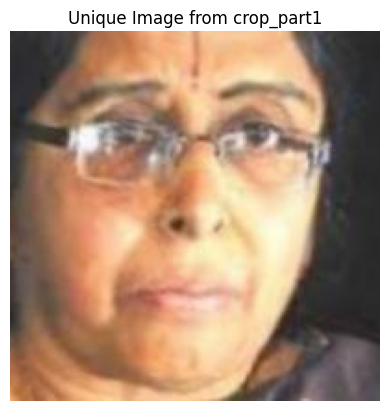

In [ ]:
files_crop_part1 = set(os.listdir(data_dir_short))
files_UTKFace = set(os.listdir(data_dir))

unique_files_crop_part1 = files_crop_part1 - files_UTKFace

if unique_files_crop_part1:
    unique_file = list(unique_files_crop_part1)[0]
    unique_file_path = os.path.join(data_dir_short, unique_file)
    print("Path to the unique file in 'crop_part1':", unique_file_path)
else:
    print("There are no unique files in the 'crop_part1' folder.")

unique_image = Image.open(unique_file_path)

plt.imshow(unique_image)
plt.axis('off')
plt.title('Unique Image from crop_part1')
plt.show()

The unique image is just an additional face image, but it has a wrong gender label. We will remove it to make sure we get a true subsample of the original dataset.

In [ ]:
os.remove(unique_file_path)

Now, let's create the dataframe:

In [16]:
def get_img_df(data_dir: str):
    """
    Function to read image paths and metadata (age, gender, race, datetime) from the file names.
    Output is a Pandas DataFrame.
    """
    filenames = os.listdir(data_dir)
    num_files = len(filenames)

    ages = []
    genders = []
    races = []
    datetimes = []
    image_paths = []

    with tqdm(total=num_files, desc="Loading Images") as pbar:
        for filename in filenames:
            split = filename.split('_')
            if len(split) >= 2:
                ages.append(int(split[0]))
                genders.append(int(split[1]))
                if len(split) >= 4:
                    races.append(split[2])
                    try:
                        datetime = split[3].split('.')[0]
                        datetimes.append(datetime)
                    except IndexError:
                        datetimes.append(-1)
                else:
                    races.append(-1)
                    datetimes.append(-1)
                image_paths.append(os.path.join(data_dir, filename))
            else:
                print(f"Ignoring file: {filename} due to unexpected format.")
            pbar.update(1)

    ages = pd.Series(ages, name='Ages')
    genders = pd.Series(genders, name='Genders')
    races = pd.Series(races, name='Race')
    datetimes = pd.Series(datetimes, name='Datetime')
    image_paths = pd.Series(image_paths, name='Image_Path')

    df = pd.concat([image_paths, ages, genders, races, datetimes], axis=1)

    return df

In [17]:
%%time
df = get_img_df(data_dir_short)


Loading Images: 100%|██████████| 9779/9779 [00:00<00:00, 375564.03it/s]

CPU times: user 35.8 ms, sys: 11.7 ms, total: 47.5 ms
Wall time: 46 ms


In [182]:
df_full = get_img_df(data_dir)


Loading Images: 100%|██████████| 23707/23707 [00:00<00:00, 405135.23it/s]


In [183]:
df['Datetime'] = pd.to_datetime(df['Datetime'].astype(str).str[:14],
                                format='%Y%m%d%H%M%S', errors='coerce')
df_full['Datetime'] = pd.to_datetime(df_full['Datetime'].astype(str).str[:14],
                                     format='%Y%m%d%H%M%S', errors='coerce')

In [19]:
df

,Image_Path,Ages,Genders,Race,Datetime
0,archive/crop_part1/9_1_2_20161219204347420.jpg...,9,1,2,2016-12-19 20:43:47
1,archive/crop_part1/1_1_2_20161219154612988.jpg...,1,1,2,2016-12-19 15:46:12
2,archive/crop_part1/16_0_0_20170104003740977.jp...,16,0,0,2017-01-04 00:37:40
3,archive/crop_part1/1_1_3_20161219230734016.jpg...,1,1,3,2016-12-19 23:07:34
4,archive/crop_part1/26_1_1_20170103181931657.jp...,26,1,1,2017-01-03 18:19:31
...,...,...,...,...,...
9774,archive/crop_part1/16_1_0_20170109212413425.jp...,16,1,0,2017-01-09 21:24:13
9775,archive/crop_part1/1_1_3_20161219224454728.jpg...,1,1,3,2016-12-19 22:44:54
9776,archive/crop_part1/71_0_0_20170104185305424.jp...,71,0,0,2017-01-04 18:53:05
9777,archive/crop_part1/54_0_0_20170109010040814.jp...,54,0,0,2017-01-09 01:00:40


In [20]:
df.describe()

,Ages,Genders,Datetime
count,9779.000000,9779.000000,9778
mean,29.418345,0.552920,2017-01-04 06:10:08.919410944
min,1.000000,0.000000,2016-12-19 14:05:25
25%,7.000000,0.000000,2017-01-03 20:54:25.500000
50%,25.000000,1.000000,2017-01-04 23:26:42.500000
75%,49.000000,1.000000,2017-01-09 22:04:49
max,110.000000,1.000000,2017-01-12 00:39:33
std,24.776542,0.497217,NaN


In [21]:
print(sorted(df['Ages'].unique().tolist()))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 95, 96, 99, 100, 101, 110]


In [185]:
print(sorted(df_full['Ages'].unique().tolist()))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 95, 96, 99, 100, 101, 103, 105, 110, 111, 115, 116]


In [22]:
df['Genders'].unique()

array([1, 0])

In [186]:
df_full['Genders'].unique()

array([1, 0])

In [23]:
df['Race'].unique()

array(['2', '0', '3', '1', '4', -1], dtype=object)

In [187]:
df_full['Race'].unique()

array(['2', '1', '0', '3', '4', -1], dtype=object)

In [24]:
df.to_csv("img_age_gender_df_short.csv")

In [188]:
df_full.to_csv("img_age_gender_df_full.csv")

In [ ]:
# Uncomment this code snippet to load the previously saved dataframe

# df = pd.read_csv("/content/drive/MyDrive/Turing College/Module 4 - Deep Learning/Project_M4_S3_AgeGender/img_age_gender_df_short.csv")
# df.drop(columns=["Unnamed: 0"], inplace=True)

# 1. EDA

## 1.1. Dataset inspection

### 1.1.1. Plotting random images

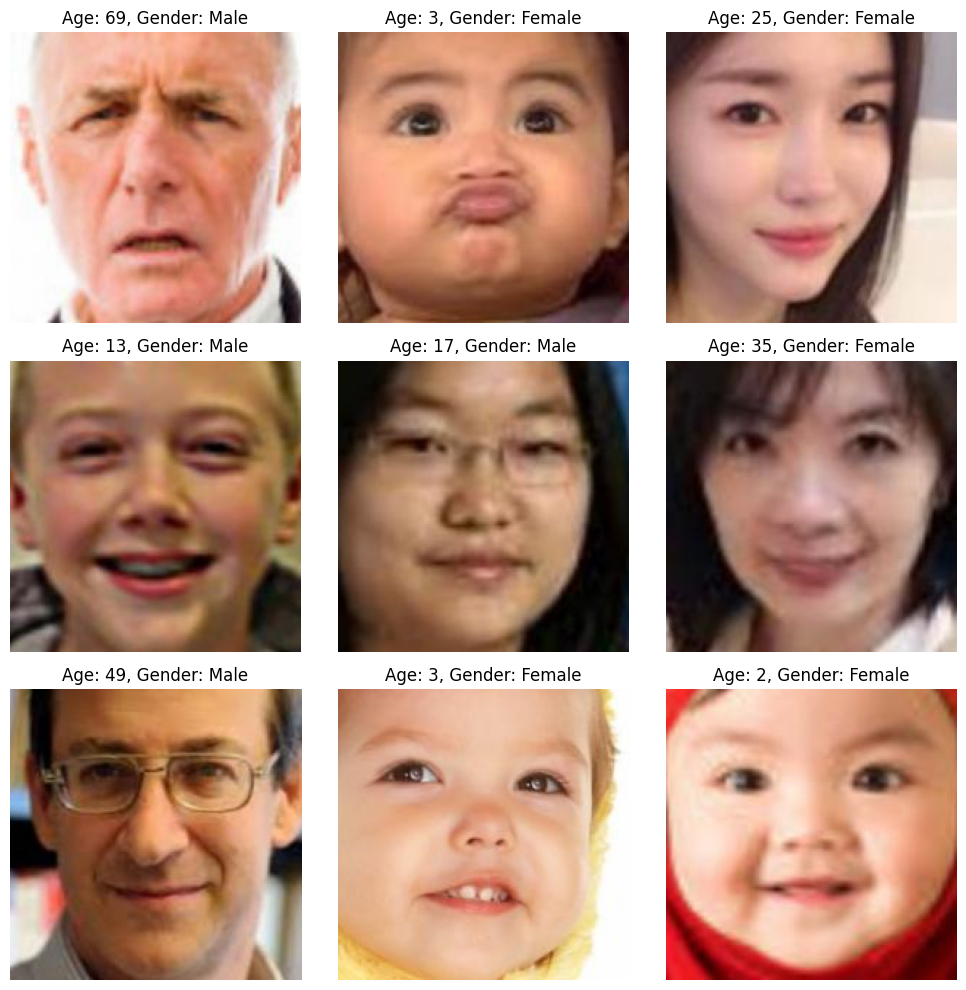

In [25]:
selected_indices = np.random.choice(df.index, 9, replace=False)

selected_image_paths = df.loc[selected_indices, 'Image_Path'].tolist()
selected_ages = df.loc[selected_indices, 'Ages'].tolist()
selected_genders = df.loc[selected_indices, 'Genders'].tolist()

fig, axes = plt.subplots(3, 3, figsize=(10, 10))

for i, (image_path, age, gender) in enumerate(zip(selected_image_paths, selected_ages, selected_genders)):
    image = Image.open(image_path)

    ax = axes[i // 3, i % 3]
    ax.imshow(image)
    ax.axis('off')
    ax.set_title(f'Age: {age}, Gender: {"Male" if gender == 0 else "Female"}')

plt.tight_layout()
plt.show()

As we can observe, the photos are resized and centered the same (at least, in the random subsample). Some of the photos have additional drawings. The picture quality is different in this dataset.  

### 1.1.2. Checking for corrupted images

In [26]:
corrupted_images = []

for idx, row in df.iterrows():
    try:
        img = Image.open(row['Image_Path']).convert('RGB')
    except Exception as e:
        print(f"Corrupted image found at index {idx}: {e}")
        corrupted_images.append(idx)

print(f"Found {len(corrupted_images)} corrupted images in the dataset")

Found 0 corrupted images in the dataset


There are no corrupted images in the dataset.

### 1.1.3. Finding Black&White images

In [27]:
def plot_and_get_low_saturation_imgs(df, sat_threshold=0.05):
    saturation_values = []
    low_saturation_indices = []

    for idx, img_path in enumerate(df['Image_Path']):
        try:
            img_array = np.array(Image.open(img_path).convert('RGB'))
        except Exception as e:
            print(f"Error loading image at index {idx}: {e}")
            continue

        if len(img_array.shape) == 2 or (len(img_array.shape) == 3 and len(np.unique(img_array)) == 2):
            saturation_values.append(0)
            if 0 <= np.mean(img_array) <= sat_threshold:
                low_saturation_indices.append(idx)
        else:
            min_rgb = np.min(img_array, axis=2)
            max_rgb = np.max(img_array, axis=2)
            max_rgb_nonzero = max_rgb.copy()
            max_rgb_nonzero[max_rgb_nonzero == 0] = 1
            saturation = 1 - (min_rgb / max_rgb_nonzero)
            mean_saturation = np.mean(saturation)
            saturation_values.append(mean_saturation)
            if mean_saturation <= sat_threshold:
                low_saturation_indices.append(idx)

    plt.hist(saturation_values, bins=50, color='blue', alpha=0.7)
    plt.title('Saturation Distribution for Images')
    plt.xlabel('Saturation')
    plt.ylabel('Frequency')
    plt.show()

    return low_saturation_indices

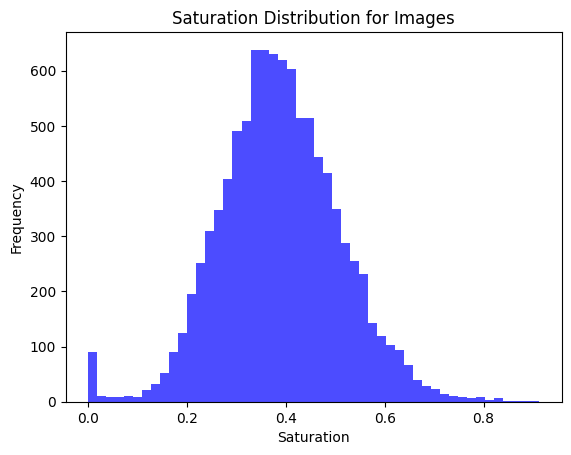

In [28]:
low_saturation_indices = plot_and_get_low_saturation_imgs(df)

In [29]:
print("Number of greyscale or b&w images:", len(low_saturation_indices))

Number of greyscale or b&w images: 104


In [30]:
low_saturation_df = df.iloc[low_saturation_indices]

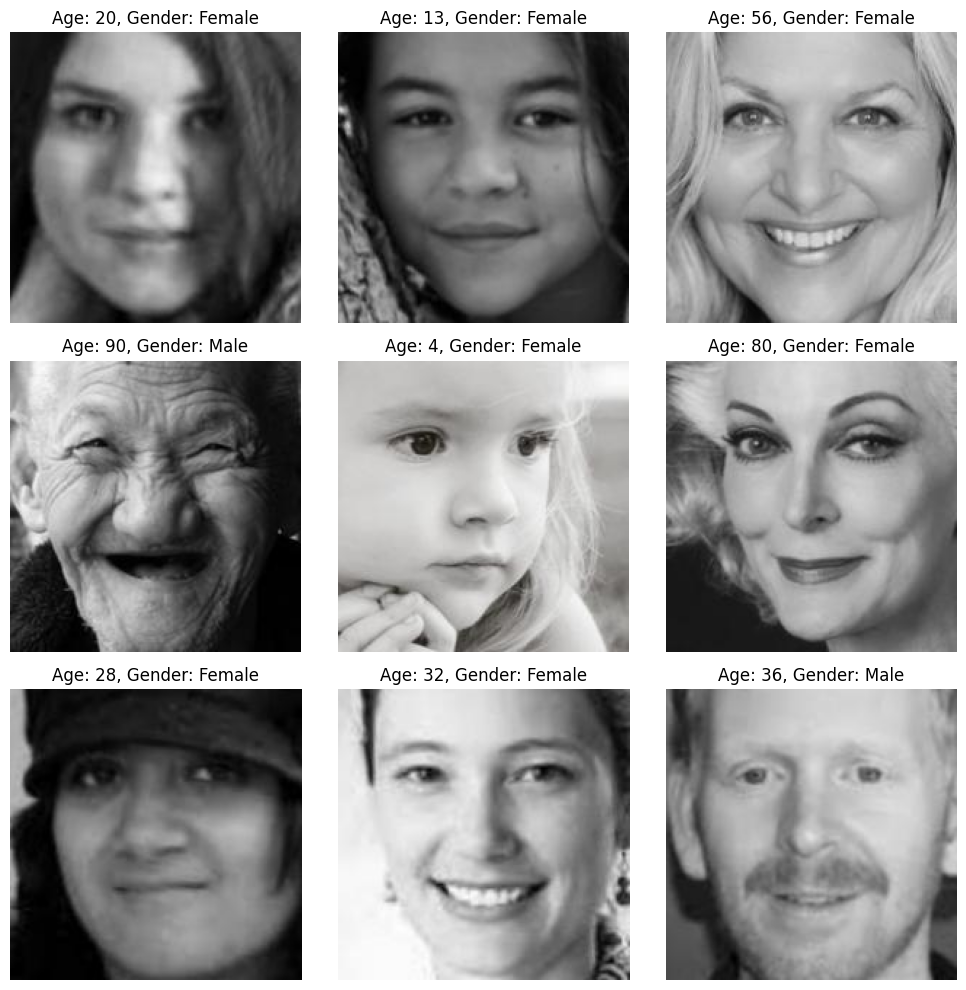

In [31]:
selected_indices = np.random.choice(low_saturation_df.index, 9, replace=False)
selected_image_paths = low_saturation_df.loc[selected_indices, 'Image_Path'].tolist()
selected_ages = low_saturation_df.loc[selected_indices, 'Ages'].tolist()
selected_genders = low_saturation_df.loc[selected_indices, 'Genders'].tolist()

fig, axes = plt.subplots(3, 3, figsize=(10, 10))

for i, (image_path, age, gender) in enumerate(zip(selected_image_paths, selected_ages,
                                                  selected_genders)):
    image = Image.open(image_path)
    ax = axes[i // 3, i % 3]
    ax.imshow(image)
    ax.axis('off')
    ax.set_title(f'Age: {age}, Gender: {"Male" if gender == 0 else "Female"}')

plt.tight_layout()
plt.show()


Since the majority of our dataset consists of colorful images and b&w may confuse the model training, we will drop b&w and greyscale images:

In [32]:
df_color = df.drop(low_saturation_indices)
df_color.reset_index(drop=True, inplace=True)

In [33]:
df_color.head(5)

,Image_Path,Ages,Genders,Race,Datetime
0,archive/crop_part1/9_1_2_20161219204347420.jpg...,9,1,2,2016-12-19 20:43:47
1,archive/crop_part1/1_1_2_20161219154612988.jpg...,1,1,2,2016-12-19 15:46:12
2,archive/crop_part1/16_0_0_20170104003740977.jp...,16,0,0,2017-01-04 00:37:40
3,archive/crop_part1/1_1_3_20161219230734016.jpg...,1,1,3,2016-12-19 23:07:34
4,archive/crop_part1/26_1_1_20170103181931657.jp...,26,1,1,2017-01-03 18:19:31


### 1.1.4. RGB and Saturation distributions

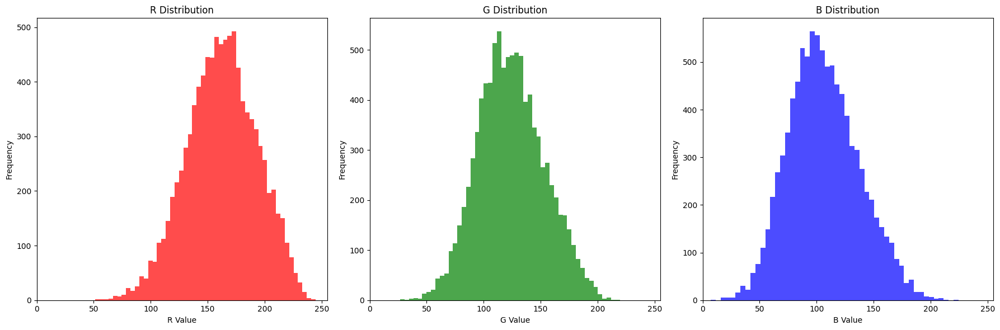

In [34]:
def calculate_rgb_average(image_path):
    img_array = np.array(Image.open(image_path))
    r_avg = np.mean(img_array[:, :, 0])
    g_avg = np.mean(img_array[:, :, 1])
    b_avg = np.mean(img_array[:, :, 2])
    return r_avg, g_avg, b_avg

df_color['R_avg'], df_color['G_avg'], df_color['B_avg'] = zip(*df_color['Image_Path'].apply(calculate_rgb_average))

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
axes = axes.ravel()

for i, color in enumerate(['R', 'G', 'B']):
    ax = axes[i]
    ax.hist(df_color[color+'_avg'], bins=50, color=color.lower(), alpha=0.7)
    ax.set_title(f'{color} Distribution')
    ax.set_xlabel(f'{color} Value')
    ax.set_ylabel('Frequency')
    ax.set_xlim(0, 255)

plt.tight_layout()
plt.show()

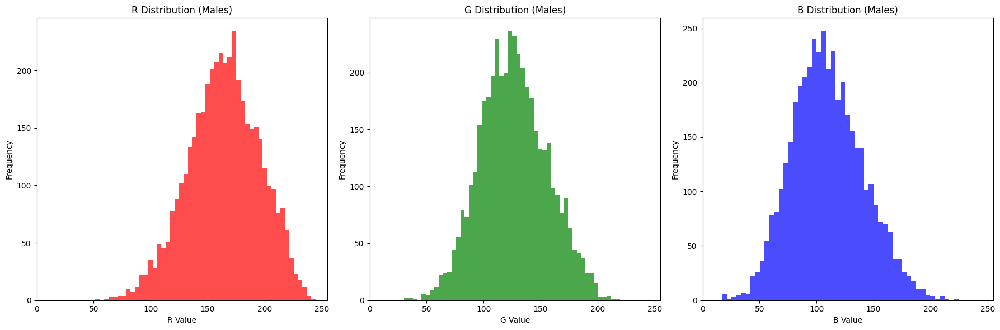

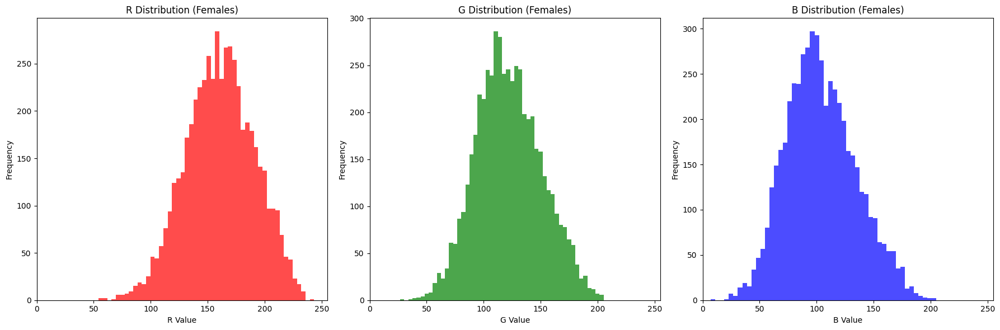

In [35]:
male_df = df_color[df_color['Genders'] == 0]
female_df = df_color[df_color['Genders'] == 1]

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
axes = axes.ravel()

for i, color in enumerate(['R', 'G', 'B']):
    ax = axes[i]
    ax.hist(male_df[color+'_avg'], bins=50, color=color.lower(), alpha=0.7)
    ax.set_title(f'{color} Distribution (Males)')
    ax.set_xlabel(f'{color} Value')
    ax.set_ylabel('Frequency')
    ax.set_xlim(0, 255)

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
axes = axes.ravel()

for i, color in enumerate(['R', 'G', 'B']):
    ax = axes[i]
    ax.hist(female_df[color+'_avg'], bins=50, color=color.lower(), alpha=0.7)
    ax.set_title(f'{color} Distribution (Females)')
    ax.set_xlabel(f'{color} Value')
    ax.set_ylabel('Frequency')
    ax.set_xlim(0, 255)

plt.tight_layout()
plt.show()

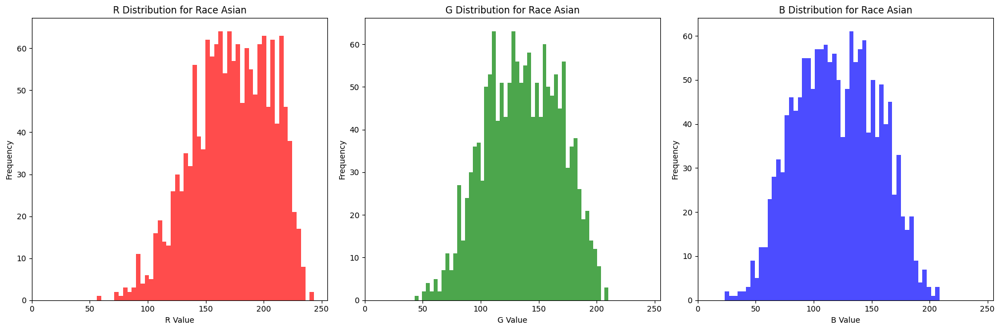

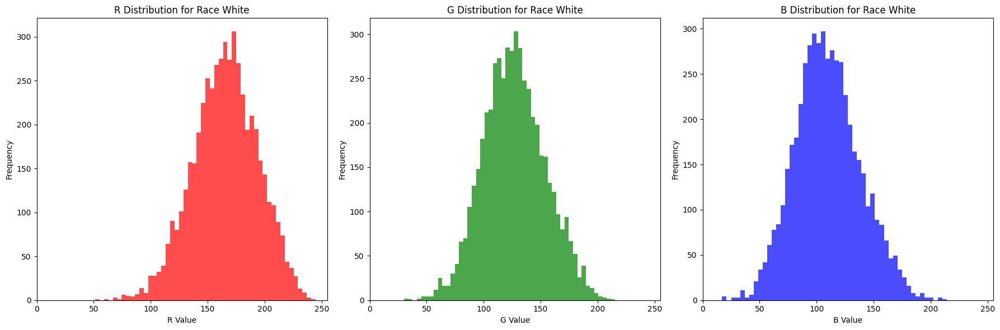

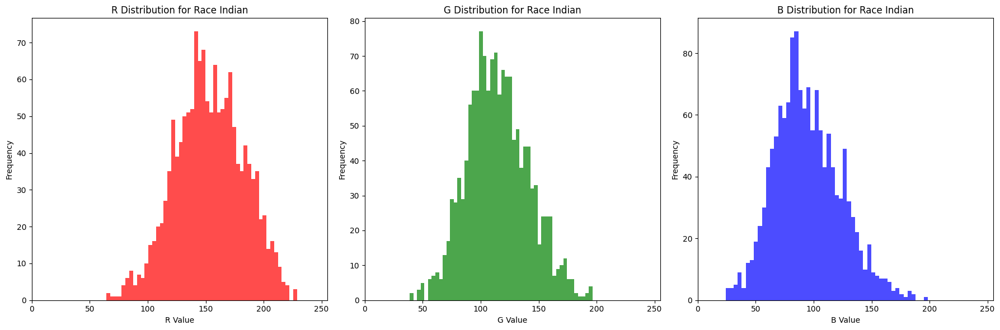

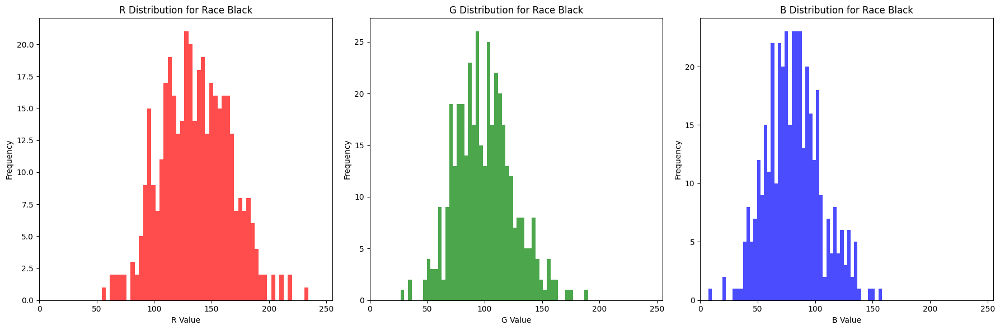

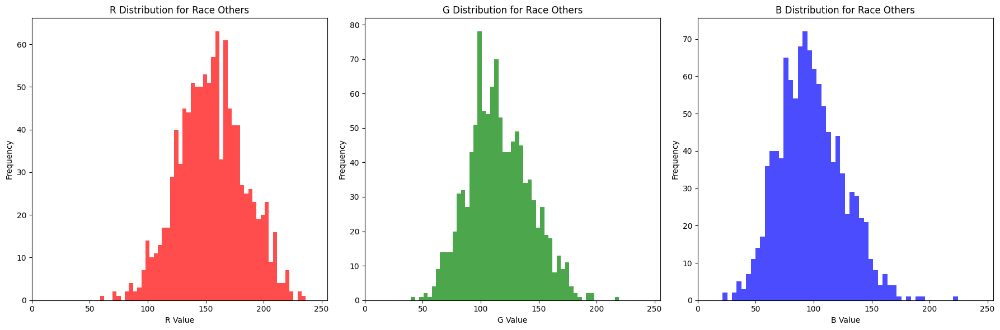

In [36]:
race_names = {
    0: 'White',
    1: 'Black',
    2: 'Asian',
    3: 'Indian',
    4: 'Others',
    -1: 'Unknown'
}

for race in df_color['Race'].unique():
    race_df = df_color[df_color['Race'] == race]
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
    axes = axes.ravel()

    for i, color in enumerate(['R', 'G', 'B']):
        ax = axes[i]
        ax.hist(race_df[color+'_avg'], bins=50, color=color.lower(), alpha=0.7)
        ax.set_title(f'{color} Distribution for Race {race_names[int(race)]}')
        ax.set_xlabel(f'{color} Value')
        ax.set_ylabel('Frequency')
        ax.set_xlim(0, 255)

    plt.tight_layout()
    plt.show()

- We can observe that color distributions are similar for gender groups.
- Color distributions for different race groups are somewhat different.

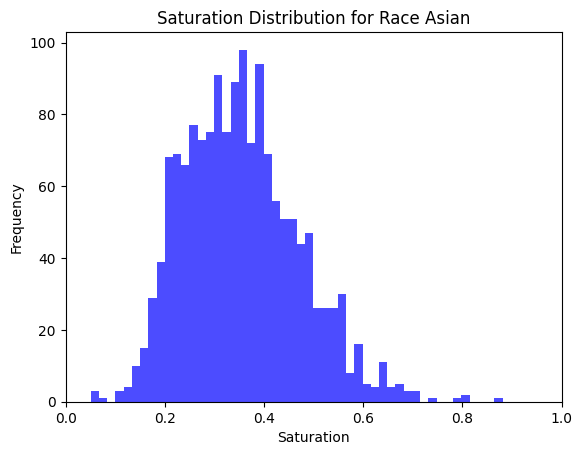

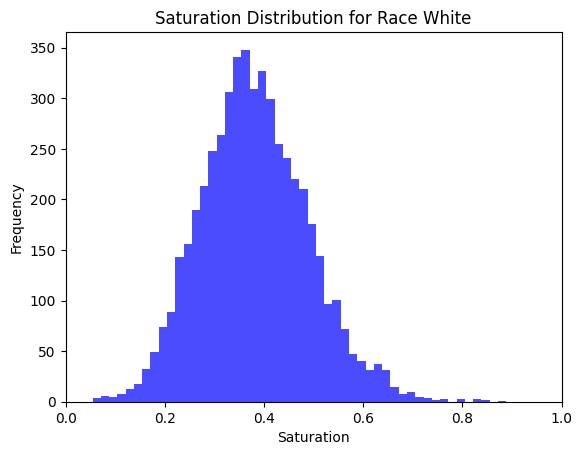

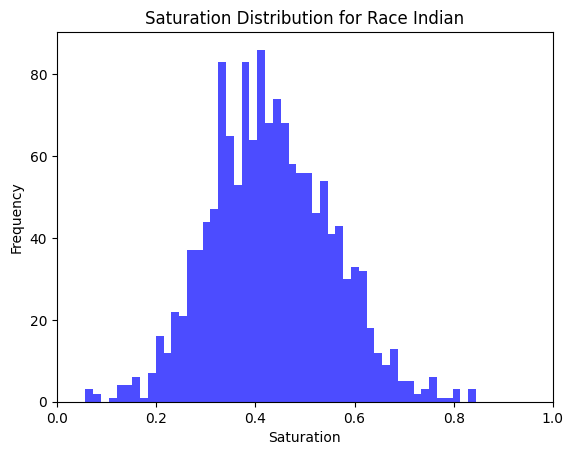

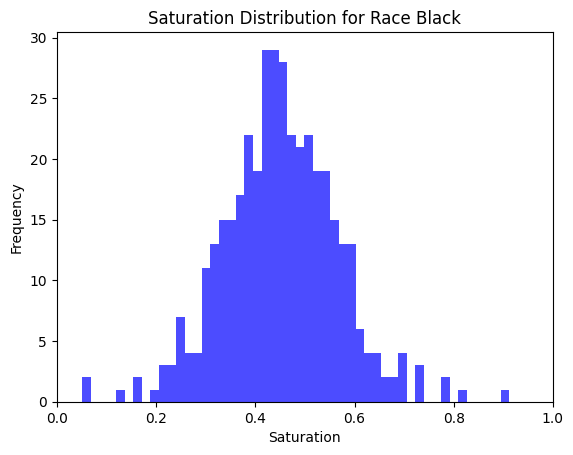

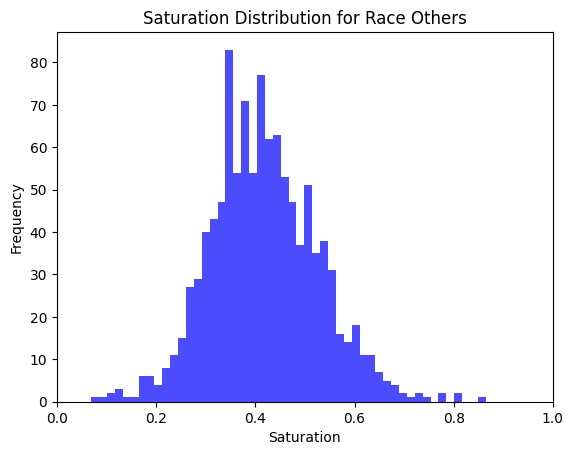

In [37]:
def calculate_saturation(image_path):
    img_array = np.array(Image.open(image_path))
    if len(img_array.shape) == 3 and img_array.shape[2] == 3:
        min_rgb = np.min(img_array, axis=2)
        max_rgb = np.max(img_array, axis=2)
        with np.errstate(divide='ignore', invalid='ignore'):
            saturation = 1 - (min_rgb / (max_rgb + 1e-10))
            return np.mean(saturation)
    else:
        return np.nan

df_color['Saturation'] = df_color['Image_Path'].apply(calculate_saturation)

for race in df_color['Race'].unique():
    race_df = df_color[df_color['Race'] == race]
    plt.hist(race_df['Saturation'].dropna(), bins=50, color='blue', alpha=0.7)
    plt.title(f'Saturation Distribution for Race {race_names[int(race)]}')
    plt.xlabel('Saturation')
    plt.ylabel('Frequency')
    plt.xlim(0, 1)
    plt.show()


- Saturation distributions are also somewhat different between the race groups.

## 1.2. Plotting distributions

### 1.2.1. Age, Gender, Race distributions

<Axes: title={'center': 'Age Distribution'}, ylabel='Frequency'>

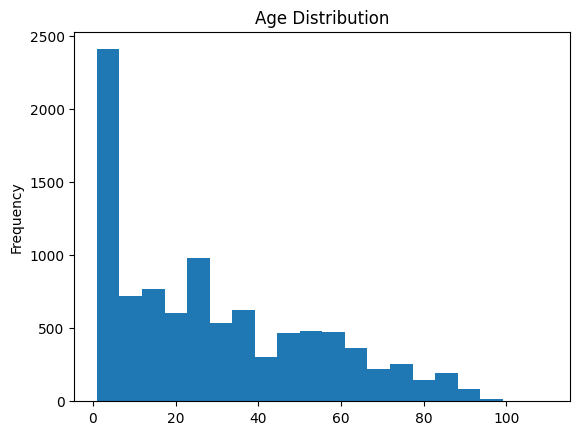

In [38]:
df_color['Ages'].plot(kind='hist', bins=20, title='Age Distribution')

/var/folders/4d/71xyxg0j2x997qs8vr55rlwr0000gn/T/ipykernel_3803/1543051274.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['Male', 'Female'])


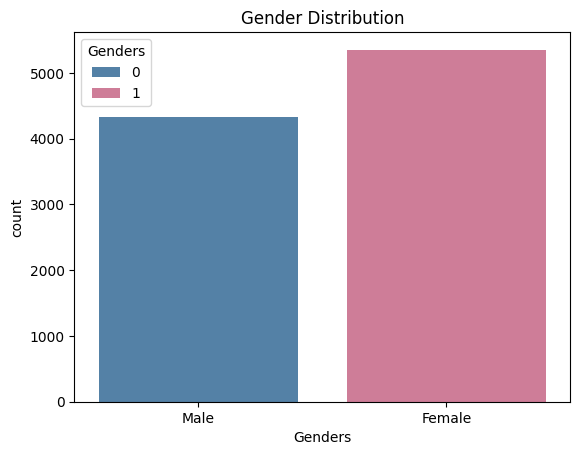

In [39]:
colors = ["steelblue", "palevioletred"]
ax = sns.countplot(data=df_color, x='Genders', hue='Genders',
                   palette=colors)
ax.set_xticklabels(['Male', 'Female'])
plt.title('Gender Distribution')
plt.show()

In [653]:
df_color['Genders'].value_counts()

Genders
1    5351
0    4324
Name: count, dtype: int64

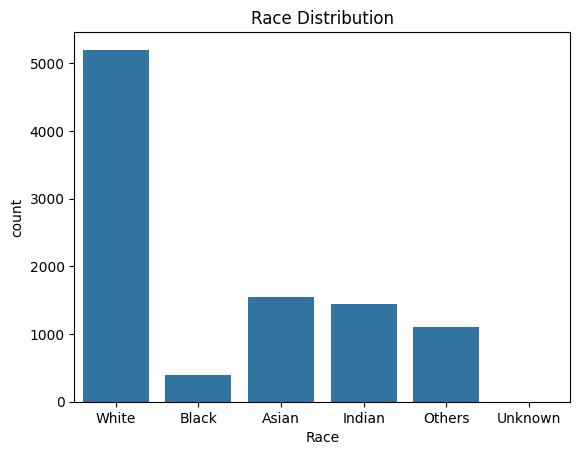

In [40]:
df_copy = df_color.copy()
df_copy['Race'] = df_copy['Race'].astype(int).map(race_names)
ax = sns.countplot(data=df_copy, x='Race', order=race_names.values())
plt.title('Race Distribution')
plt.show()

/var/folders/4d/71xyxg0j2x997qs8vr55rlwr0000gn/T/ipykernel_3803/3265794997.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['Male', 'Female'])


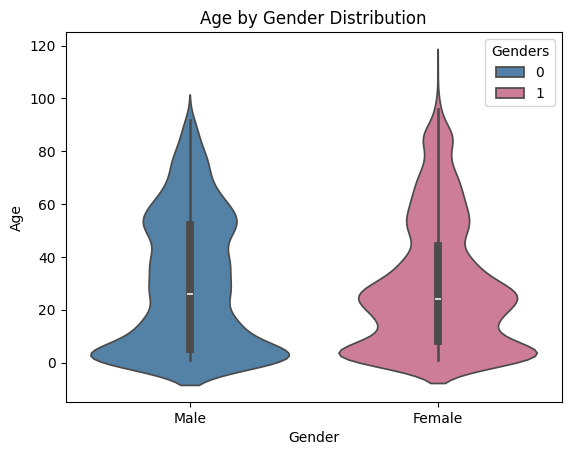

In [41]:
colors = ["steelblue", "palevioletred"]
ax = sns.violinplot(data=df_color, x='Genders', y='Ages',
                    hue='Genders', palette=colors)
ax.set_title('Age by Gender Distribution')
ax.set_xlabel('Gender')
ax.set_ylabel('Age')
ax.set_xticklabels(['Male', 'Female'])
plt.show()

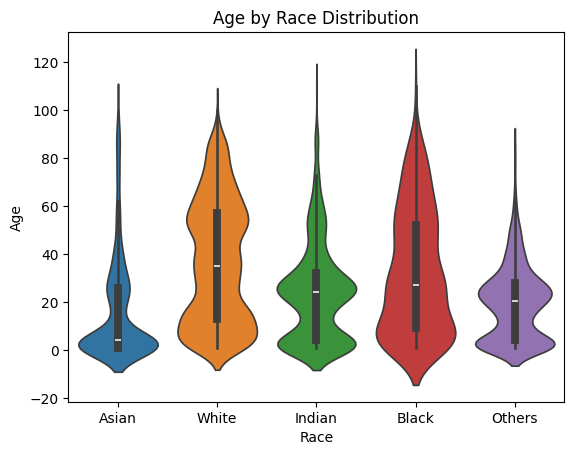

In [42]:
ax = sns.violinplot(data=df_copy, x='Race', y='Ages',
                    hue='Race')
ax.set_title('Age by Race Distribution')
ax.set_xlabel('Race')
ax.set_ylabel('Age')
plt.show()

- The age distribution is right skewed; there are many images of babies.
- There are more female faces than male ones, but the imbalance isn't drastic.
- There is class imbalance in race groups: the majority of people are white.
- Age distributions by gender are similar.
- Among the race groups, there are more younger Asian people and more older White and Black people.

# 2. Preprocessing

In [43]:
df_short = df_color.loc[:,['Image_Path', 'Ages', 'Genders']]
df_short['Ages'] = df_short['Ages'].astype("int")
df_short['Genders'] = df_short['Genders'].astype("category")

In [44]:
df_short.head(5)

,Image_Path,Ages,Genders
0,archive/crop_part1/9_1_2_20161219204347420.jpg...,9,1
1,archive/crop_part1/1_1_2_20161219154612988.jpg...,1,1
2,archive/crop_part1/16_0_0_20170104003740977.jp...,16,0
3,archive/crop_part1/1_1_3_20161219230734016.jpg...,1,1
4,archive/crop_part1/26_1_1_20170103181931657.jp...,26,1


Let's perform binning of age values for further stratified splitting:

In [45]:
age_groups = {
    '0-2': (0, 2),
    '3-5': (3, 5),
    '6-12': (6, 12),
    '13-18': (13, 18),
    '19-22': (19, 22),
    '23-35': (23, 35),
    '36-50': (36, 50),
    '51-65': (51, 65),
    '66-80': (66, 80),
    '81+': (81, 120),
}

def assign_age_group(age):
    for group, (start, end) in age_groups.items():
        if start <= age <= end:
            return group
    return 'Unknown'

df_short['Age_group'] = df_short['Ages'].apply(assign_age_group)

In [47]:
df_short.to_csv("df_preprocessed.csv")

In [253]:
df_short = pd.read_csv("df_preprocessed.csv")
df_short.drop(columns=["Unnamed: 0"], inplace=True)

In [255]:
ordinal_encoder = OrdinalEncoder(categories=[list(age_groups.keys())])
df_short['Age_group'] = ordinal_encoder.fit_transform(df_short[['Age_group']])

In [257]:
X = df_short[['Image_Path']]
y = df_short[['Ages', 'Age_group', 'Genders']]

stratify_cols = ['Age_group', 'Genders']

X_train, X_val_test, y_train, y_val_test = train_test_split(X, y, test_size=0.2,
                                                            stratify=y['Age_group'],
                                                            random_state=42)

X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test,
                                                stratify=y_val_test['Age_group'],
                                                test_size=0.5, random_state=42)

y_train_cls = y_train.copy(deep=True)
y_val_cls = y_val.copy(deep=True)
y_test_cls = y_test.copy(deep=True)

y_train.drop(columns=['Age_group'], inplace=True)
y_val.drop(columns=['Age_group'], inplace=True)
y_test.drop(columns=['Age_group'], inplace=True)

y_train_cls.drop(columns=['Ages'], inplace=True)
y_val_cls.drop(columns=['Ages'], inplace=True)
y_test_cls.drop(columns=['Ages'], inplace=True)

X_train.reset_index(drop=True, inplace=True)
X_val.reset_index(drop=True, inplace=True)
X_test.reset_index(drop=True, inplace=True)

y_train.reset_index(drop=True, inplace=True)
y_val.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)

y_train_cls.reset_index(drop=True, inplace=True)
y_val_cls.reset_index(drop=True, inplace=True)
y_test_cls.reset_index(drop=True, inplace=True)

print("Train set shape (X and y):", X_train.shape, y_train.shape, y_train_cls.shape)
print("Validation set shape (X and y):", X_val.shape, y_val.shape, y_val_cls.shape)
print("Test set shape (X and y):", X_test.shape, y_test.shape, y_test_cls.shape)

Train set shape (X and y): (7740, 1) (7740, 2) (7740, 2)
Validation set shape (X and y): (967, 1) (967, 2) (967, 2)
Test set shape (X and y): (968, 1) (968, 2) (968, 2)


In [259]:
class CustomDataset(Dataset):
    def __init__(self, image_paths, age_labels, gender_labels, transform=None):
        self.image_paths = image_paths
        self.age_labels = age_labels
        self.gender_labels = gender_labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        img = Image.open(image_path).convert('RGB')

        if self.transform:
            img = self.transform(img)

        age_label = self.age_labels[idx]
        gender_label = self.gender_labels[idx]

        return img, (age_label, gender_label)

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = CustomDataset(X_train['Image_Path'], y_train['Ages'], 
                              y_train['Genders'], transform=train_transform)
val_dataset = CustomDataset(X_val['Image_Path'], y_val['Ages'], 
                            y_val['Genders'], transform=val_transform)
test_dataset = CustomDataset(X_test['Image_Path'], y_test['Ages'], 
                             y_test['Genders'], transform=val_transform)

train_dataloader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=8)
test_dataloader = DataLoader(test_dataset, batch_size=8)

# 3. Model Training, Fine-tuning, and Testing

Let's get more information on the feature extractor that we're going to use - ResNet18:

In [164]:
resnet18 = models.resnet18(weights=ResNet18_Weights.DEFAULT)
all_layers = list(resnet18.named_children())
third_last, second_last, last = all_layers[-4][0], all_layers[-3][0], all_layers[-1][0]
print("Third last layer:", third_last)
print("Second last layer:", second_last)
print("Last layer:", last)
summary(resnet18, (3, 224, 224), device="cpu")

Third last layer: layer3
Second last layer: layer4
Last layer: fc
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 6

## 3.1. Training and fine-tuning the multi-task model - Age regression + Gender classification

#### Training the model with one last ResNet18 base layer unfrozen and optimized learning rate, batch size, number of initial training epochs with frozen base layers, and dropout rate

In [654]:
from model_class import MultiTaskModel

In [374]:
def objective(trial):
    try:
        batch_size = trial.suggest_categorical('batch_size', [4, 8, 16, 32])
        learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-3, log=True)
        dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.7, step=0.1)
        initial_epochs = trial.suggest_int('initial_epochs', 1, 2)

        train_dataloader_lr = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        val_dataloader_lr = DataLoader(val_dataset, batch_size=batch_size)

        feature_extractor = models.resnet18(pretrained=True)
        model_lr = MultiTaskModel(
            unfreeze_layers=['layer4'],
            initial_epochs=initial_epochs,
            feature_extractor=feature_extractor,
            additional_fc=True,
            dropout_rate=dropout_rate,
            learning_rate=learning_rate
        )

        model_lr.train_losses = []
        model_lr.val_losses = []
        
        total_epochs = 3
        trainer = pl.Trainer(max_epochs=total_epochs, logger=True, enable_checkpointing=False)
        trainer.fit(model_lr, train_dataloader_lr, val_dataloader_lr)

        train_loss = sum(model_lr.train_losses) / len(model_lr.train_losses)
        val_loss = sum(model_lr.val_losses) / len(model_lr.val_losses)
        logging.info(f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

        return val_loss
    except Exception as e:
        logging.error(f"Error occurred during optimization: {e}")
        return 1e9 

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=10)

best_params = study.best_params
best_batch_size = best_params['batch_size']
best_learning_rate = best_params['learning_rate']
best_dropout_rate = best_params['dropout_rate']
best_initial_epochs = best_params['initial_epochs']

print(f'Best batch size: {best_batch_size}')
print(f'Best learning rate: {best_learning_rate}')
print(f'Best dropout rate: {best_dropout_rate}')
print(f'Best initial epochs: {best_initial_epochs}')

[I 2024-04-11 01:12:42,887] A new study created in memory with name: no-name-03957077-3da3-41db-a625-93d52c0d6328
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name              | Type        | Params
--------------------------------------------------
0 | feature_extractor | ResNet      | 11.4 M
1 | batch_norm        | BatchNorm1d | 1.0 K 
2 | dropout           | Dropout     | 0     
3 | gender_classifier | Linear      | 513   
4 | age_regressor     | Linear      | 513   
--------------------------------------------------
11.4 M    Trainable params
0         Non-trainable params
11.4 M    Total params
45.766    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

INFO - No validation metrics for this epoch.


Training: |          | 0/? [00:00<?, ?it/s]

INFO - Freezing all base layers...
INFO - Training for epoch 0 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 30.101224899291992
INFO - avg_val_gender_bce_loss: 0.7182086706161499
INFO - avg_val_age_mae_loss: 29.381797790527344
INFO - avg_val_gender_acc: 0.4715615212917328
INFO - avg_val_gender_f1: 0.45717814564704895
INFO - avg_val_age_r2: -1.50728440284729
INFO - avg_val_age_mse: 1478.86181640625
INFO - Epoch 0. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 30.04801368713379
INFO - avg_train_gender_bce_loss: 0.7376755475997925
INFO - avg_train_age_mae_loss: 29.30610466003418
INFO - avg_train_gender_acc: 0.5095607042312622
INFO - avg_train_gender_f1: 0.5334025025367737
INFO - avg_train_age_r2: -1.4963507652282715
INFO - avg_train_age_mse: 1470.9140625
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 1 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 29.88808250427246
INFO - avg_val_gender_bce_loss: 0.6039301156997681
INFO - avg_val_age_mae_loss: 29.282272338867188
INFO - avg_val_gender_acc: 0.6990692615509033
INFO - avg_val_gender_f1: 0.7373842000961304
INFO - avg_val_age_r2: -1.4934953451156616
INFO - avg_val_age_mse: 1470.9603271484375
INFO - Epoch 1. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 29.96295166015625
INFO - avg_train_gender_bce_loss: 0.6841703057289124
INFO - avg_train_age_mae_loss: 29.274309158325195
INFO - avg_train_gender_acc: 0.5700258612632751
INFO - avg_train_gender_f1: 0.5933682918548584
INFO - avg_train_age_r2: -1.4924538135528564
INFO - avg_train_age_mse: 1467.799072265625
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 2 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 29.800846099853516
INFO - avg_val_gender_bce_loss: 0.5379607677459717
INFO - avg_val_age_mae_loss: 29.259729385375977
INFO - avg_val_gender_acc: 0.7456049919128418
INFO - avg_val_gender_f1: 0.7817826867103577
INFO - avg_val_age_r2: -1.48898184299469
INFO - avg_val_age_mse: 1468.37255859375
INFO - Epoch 2. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 29.85881996154785
INFO - avg_train_gender_bce_loss: 0.6147788166999817
INFO - avg_train_age_mae_loss: 29.23862648010254
INFO - avg_train_gender_acc: 0.6590439081192017
INFO - avg_train_gender_f1: 0.6814090609550476
INFO - avg_train_age_r2: -1.4801251888275146
INFO - avg_train_age_mse: 1464.12255859375
`Trainer.fit` stopped: `max_epochs=3` reached.
INFO - Train Loss: 29.9566, Val Loss: 29.9301
[I 2024-04-11 02:19:32,622] Trial 0 finished with value: 29.93005116780599 and parameters: {'batch_size': 32, 'learning_rate': 1.1607697035377497e-05, 'dropout_rate': 0.30000000000000004, 'initial_epochs': 1}. B

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

INFO - No validation metrics for this epoch.


Training: |          | 0/? [00:00<?, ?it/s]

INFO - Freezing all base layers...
INFO - Training for epoch 0 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 28.000253677368164
INFO - avg_val_gender_bce_loss: 0.6598874926567078
INFO - avg_val_age_mae_loss: 27.33088493347168
INFO - avg_val_gender_acc: 0.5853154063224792
INFO - avg_val_gender_f1: 0.7004354000091553
INFO - avg_val_age_r2: -1.787580966949463
INFO - avg_val_age_mse: 1344.2493896484375
INFO - Epoch 0. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 29.218473434448242
INFO - avg_train_gender_bce_loss: 0.7181745171546936
INFO - avg_train_age_mae_loss: 28.49308204650879
INFO - avg_train_gender_acc: 0.5301033854484558
INFO - avg_train_gender_f1: 0.5548872947692871
INFO - avg_train_age_r2: -1.8111698627471924
INFO - avg_train_age_mse: 1415.8790283203125
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 1 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 17.219337463378906
INFO - avg_val_gender_bce_loss: 0.5222485065460205
INFO - avg_val_age_mae_loss: 16.681304931640625
INFO - avg_val_gender_acc: 0.7135470509529114
INFO - avg_val_gender_f1: 0.7536494135856628
INFO - avg_val_age_r2: -0.17732322216033936
INFO - avg_val_age_mse: 627.4291381835938
INFO - Epoch 1. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 24.162551879882812
INFO - avg_train_gender_bce_loss: 0.6262845993041992
INFO - avg_train_age_mae_loss: 23.519329071044922
INFO - avg_train_gender_acc: 0.6414728760719299
INFO - avg_train_gender_f1: 0.6830929517745972
INFO - avg_train_age_r2: -1.0095155239105225
INFO - avg_train_age_mse: 1047.7259521484375
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 2 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 9.143481254577637
INFO - avg_val_gender_bce_loss: 0.523873507976532
INFO - avg_val_age_mae_loss: 8.603165626525879
INFO - avg_val_gender_acc: 0.7290589213371277
INFO - avg_val_gender_f1: 0.7681336402893066
INFO - avg_val_age_r2: 0.6635164618492126
INFO - avg_val_age_mse: 173.82470703125
INFO - Epoch 2. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 14.936447143554688
INFO - avg_train_gender_bce_loss: 0.6043882966041565
INFO - avg_train_age_mae_loss: 14.311166763305664
INFO - avg_train_gender_acc: 0.6586563587188721
INFO - avg_train_gender_f1: 0.6987196803092957
INFO - avg_train_age_r2: 0.19717223942279816
INFO - avg_train_age_mse: 429.7350158691406
`Trainer.fit` stopped: `max_epochs=3` reached.
INFO - Train Loss: 22.7725, Val Loss: 18.1210
[I 2024-04-11 02:33:48,171] Trial 1 finished with value: 18.121024131774902 and parameters: {'batch_size': 8, 'learning_rate': 0.00011782324383153466, 'dropout_rate': 0.4, 'initial_epochs': 1}. Best is trial 1 w

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

INFO - No validation metrics for this epoch.


Training: |          | 0/? [00:00<?, ?it/s]

INFO - Freezing all base layers...
INFO - Training for epoch 0 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 30.00963592529297
INFO - avg_val_gender_bce_loss: 0.696256160736084
INFO - avg_val_age_mae_loss: 29.31244659423828
INFO - avg_val_gender_acc: 0.5480868816375732
INFO - avg_val_gender_f1: 0.6996259689331055
INFO - avg_val_age_r2: -1.5016872882843018
INFO - avg_val_age_mse: 1475.9127197265625
INFO - Epoch 0. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 30.032316207885742
INFO - avg_train_gender_bce_loss: 0.7716283798217773
INFO - avg_train_age_mae_loss: 29.253454208374023
INFO - avg_train_gender_acc: 0.5091731548309326
INFO - avg_train_gender_f1: 0.533694863319397
INFO - avg_train_age_r2: -1.4970545768737793
INFO - avg_train_age_mse: 1466.978515625
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 1 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 29.638442993164062
INFO - avg_val_gender_bce_loss: 0.6046043038368225
INFO - avg_val_age_mae_loss: 29.032533645629883
INFO - avg_val_gender_acc: 0.6163392066955566
INFO - avg_val_gender_f1: 0.7358622550964355
INFO - avg_val_age_r2: -1.4631034135818481
INFO - avg_val_age_mse: 1453.8309326171875
INFO - Epoch 1. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 29.883596420288086
INFO - avg_train_gender_bce_loss: 0.7111530900001526
INFO - avg_train_age_mae_loss: 29.165142059326172
INFO - avg_train_gender_acc: 0.5686046481132507
INFO - avg_train_gender_f1: 0.5901513695716858
INFO - avg_train_age_r2: -1.489719271659851
INFO - avg_train_age_mse: 1458.359619140625
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 2 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 29.445114135742188
INFO - avg_val_gender_bce_loss: 0.5138530135154724
INFO - avg_val_age_mae_loss: 28.9283390045166
INFO - avg_val_gender_acc: 0.7394002079963684
INFO - avg_val_gender_f1: 0.7968906164169312
INFO - avg_val_age_r2: -1.4506176710128784
INFO - avg_val_age_mse: 1446.9444580078125
INFO - Epoch 2. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 29.69856071472168
INFO - avg_train_gender_bce_loss: 0.638067364692688
INFO - avg_train_age_mae_loss: 29.052478790283203
INFO - avg_train_gender_acc: 0.6410852670669556
INFO - avg_train_gender_f1: 0.661742091178894
INFO - avg_train_age_r2: -1.467585802078247
INFO - avg_train_age_mse: 1450.037841796875
`Trainer.fit` stopped: `max_epochs=3` reached.
INFO - Train Loss: 29.8715, Val Loss: 29.6977
[I 2024-04-11 03:17:31,416] Trial 2 finished with value: 29.697731018066406 and parameters: {'batch_size': 32, 'learning_rate': 3.3475220691850815e-05, 'dropout_rate': 0.6, 'initial_epochs': 1}. Best is trial 1

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

INFO - No validation metrics for this epoch.


Training: |          | 0/? [00:00<?, ?it/s]

INFO - Freezing all base layers...
INFO - Training for epoch 0 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 21.15009307861328
INFO - avg_val_gender_bce_loss: 0.6116797924041748
INFO - avg_val_age_mae_loss: 20.525028228759766
INFO - avg_val_gender_acc: 0.6359875798225403
INFO - avg_val_gender_f1: 0.7359786629676819
INFO - avg_val_age_r2: -0.3765885829925537
INFO - avg_val_age_mse: 825.5419311523438
INFO - Epoch 0. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 26.57410430908203
INFO - avg_train_gender_bce_loss: 0.6411998867988586
INFO - avg_train_age_mae_loss: 25.917739868164062
INFO - avg_train_gender_acc: 0.6214470267295837
INFO - avg_train_gender_f1: 0.653558075428009
INFO - avg_train_age_r2: -1.0751539468765259
INFO - avg_train_age_mse: 1231.381103515625
INFO - Freezing all base layers...
INFO - Training for epoch 1 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 17.15070152282715
INFO - avg_val_gender_bce_loss: 0.5868097543716431
INFO - avg_val_age_mae_loss: 16.548851013183594
INFO - avg_val_gender_acc: 0.670113742351532
INFO - avg_val_gender_f1: 0.751717209815979
INFO - avg_val_age_r2: 0.16355526447296143
INFO - avg_val_age_mse: 505.4908447265625
INFO - Epoch 1. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 18.87343978881836
INFO - avg_train_gender_bce_loss: 0.605425238609314
INFO - avg_train_age_mae_loss: 18.24583625793457
INFO - avg_train_gender_acc: 0.6630491018295288
INFO - avg_train_gender_f1: 0.7121769785881042
INFO - avg_train_age_r2: -0.013343560509383678
INFO - avg_train_age_mse: 607.3848266601562
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 2 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 9.749815940856934
INFO - avg_val_gender_bce_loss: 0.5091845393180847
INFO - avg_val_age_mae_loss: 9.209233283996582
INFO - avg_val_gender_acc: 0.7300930619239807
INFO - avg_val_gender_f1: 0.7617639899253845
INFO - avg_val_age_r2: 0.7434823513031006
INFO - avg_val_age_mse: 147.5296173095703
INFO - Epoch 2. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 10.089417457580566
INFO - avg_train_gender_bce_loss: 0.5977422595024109
INFO - avg_train_age_mae_loss: 9.470547676086426
INFO - avg_train_gender_acc: 0.6595607399940491
INFO - avg_train_gender_f1: 0.7091703414916992
INFO - avg_train_age_r2: 0.6915423274040222
INFO - avg_train_age_mse: 176.8477020263672
`Trainer.fit` stopped: `max_epochs=3` reached.
INFO - Train Loss: 18.5123, Val Loss: 16.0169
[I 2024-04-11 03:29:30,601] Trial 3 finished with value: 16.01687018076579 and parameters: {'batch_size': 32, 'learning_rate': 0.0007539801127396309, 'dropout_rate': 0.1, 'initial_epochs': 2}. Best is trial 3 w

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

INFO - No validation metrics for this epoch.


Training: |          | 0/? [00:00<?, ?it/s]

INFO - Freezing all base layers...
INFO - Training for epoch 0 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 30.19803237915039
INFO - avg_val_gender_bce_loss: 0.6738951802253723
INFO - avg_val_age_mae_loss: 29.52162742614746
INFO - avg_val_gender_acc: 0.5780765414237976
INFO - avg_val_gender_f1: 0.6843163967132568
INFO - avg_val_age_r2: -1.5230456590652466
INFO - avg_val_age_mse: 1487.911865234375
INFO - Epoch 0. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 30.01266098022461
INFO - avg_train_gender_bce_loss: 0.7184258103370667
INFO - avg_train_age_mae_loss: 29.290470123291016
INFO - avg_train_gender_acc: 0.516925036907196
INFO - avg_train_gender_f1: 0.5308099985122681
INFO - avg_train_age_r2: -1.5044949054718018
INFO - avg_train_age_mse: 1470.470458984375
INFO - Freezing all base layers...
INFO - Training for epoch 1 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 30.071073532104492
INFO - avg_val_gender_bce_loss: 0.6647326946258545
INFO - avg_val_age_mae_loss: 29.404315948486328
INFO - avg_val_gender_acc: 0.5987590551376343
INFO - avg_val_gender_f1: 0.6974261999130249
INFO - avg_val_age_r2: -1.5110429525375366
INFO - avg_val_age_mse: 1480.9937744140625
INFO - Epoch 1. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 29.912250518798828
INFO - avg_train_gender_bce_loss: 0.7090408205986023
INFO - avg_train_age_mae_loss: 29.199417114257812
INFO - avg_train_gender_acc: 0.5390180945396423
INFO - avg_train_gender_f1: 0.5562607049942017
INFO - avg_train_age_r2: -1.4957711696624756
INFO - avg_train_age_mse: 1464.876953125
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 2 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 29.650054931640625
INFO - avg_val_gender_bce_loss: 0.4688669443130493
INFO - avg_val_age_mae_loss: 29.175424575805664
INFO - avg_val_gender_acc: 0.7869700193405151
INFO - avg_val_gender_f1: 0.8113296031951904
INFO - avg_val_age_r2: -1.4749773740768433
INFO - avg_val_age_mse: 1460.541259765625
INFO - Epoch 2. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 29.70785903930664
INFO - avg_train_gender_bce_loss: 0.5997159481048584
INFO - avg_train_age_mae_loss: 29.10248374938965
INFO - avg_train_gender_acc: 0.6724806427955627
INFO - avg_train_gender_f1: 0.6835175156593323
INFO - avg_train_age_r2: -1.4589327573776245
INFO - avg_train_age_mse: 1454.4986572265625
`Trainer.fit` stopped: `max_epochs=3` reached.
INFO - Train Loss: 29.8776, Val Loss: 29.9731
[I 2024-04-11 03:41:16,225] Trial 4 finished with value: 29.973053614298504 and parameters: {'batch_size': 32, 'learning_rate': 2.9417170576317837e-05, 'dropout_rate': 0.2, 'initial_epochs': 2}. Best is tri

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

INFO - No validation metrics for this epoch.


Training: |          | 0/? [00:00<?, ?it/s]

INFO - Freezing all base layers...
INFO - Training for epoch 0 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 26.248188018798828
INFO - avg_val_gender_bce_loss: 0.6187165379524231
INFO - avg_val_age_mae_loss: 25.61576271057129
INFO - avg_val_gender_acc: 0.6494312286376953
INFO - avg_val_gender_f1: 0.7422322034835815
INFO - avg_val_age_r2: -1.122580647468567
INFO - avg_val_age_mse: 1211.7540283203125
INFO - Epoch 0. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 28.714820861816406
INFO - avg_train_gender_bce_loss: 0.6723644137382507
INFO - avg_train_age_mae_loss: 28.03284454345703
INFO - avg_train_gender_acc: 0.5851421356201172
INFO - avg_train_gender_f1: 0.6273654699325562
INFO - avg_train_age_r2: -1.4430391788482666
INFO - avg_train_age_mse: 1378.6104736328125
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 1 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 9.307692527770996
INFO - avg_val_gender_bce_loss: 0.48375698924064636
INFO - avg_val_age_mae_loss: 8.801313400268555
INFO - avg_val_gender_acc: 0.7600827217102051
INFO - avg_val_gender_f1: 0.7804638147354126
INFO - avg_val_age_r2: 0.681443989276886
INFO - avg_val_age_mse: 186.91983032226562
INFO - Epoch 1. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 18.368467330932617
INFO - avg_train_gender_bce_loss: 0.5620297193527222
INFO - avg_train_age_mae_loss: 17.78673553466797
INFO - avg_train_gender_acc: 0.6941860318183899
INFO - avg_train_gender_f1: 0.7374160885810852
INFO - avg_train_age_r2: -0.12947063148021698
INFO - avg_train_age_mse: 653.9020385742188
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 2 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 8.147933959960938
INFO - avg_val_gender_bce_loss: 0.42685550451278687
INFO - avg_val_age_mae_loss: 7.694149971008301
INFO - avg_val_gender_acc: 0.7869700193405151
INFO - avg_val_gender_f1: 0.791467547416687
INFO - avg_val_age_r2: 0.7486807703971863
INFO - avg_val_age_mse: 141.5100860595703
INFO - Epoch 2. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 9.83301067352295
INFO - avg_train_gender_bce_loss: 0.5189923048019409
INFO - avg_train_age_mae_loss: 9.290366172790527
INFO - avg_train_gender_acc: 0.7240310311317444
INFO - avg_train_gender_f1: 0.755247175693512
INFO - avg_train_age_r2: 0.6840494871139526
INFO - avg_train_age_mse: 173.81033325195312
`Trainer.fit` stopped: `max_epochs=3` reached.
INFO - Train Loss: 18.9721, Val Loss: 14.5679
[I 2024-04-11 11:43:04,532] Trial 5 finished with value: 14.567938168843588 and parameters: {'batch_size': 16, 'learning_rate': 0.00024301160160987157, 'dropout_rate': 0.2, 'initial_epochs': 1}. Best is trial 5 w

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

INFO - No validation metrics for this epoch.


Training: |          | 0/? [00:00<?, ?it/s]

INFO - Freezing all base layers...
INFO - Training for epoch 0 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 17.298357009887695
INFO - avg_val_gender_bce_loss: 0.5842799544334412
INFO - avg_val_age_mae_loss: 16.69867515563965
INFO - avg_val_gender_acc: 0.672182023525238
INFO - avg_val_gender_f1: 0.7366447448730469
INFO - avg_val_age_r2: 0.012220460921525955
INFO - avg_val_age_mse: 506.14910888671875
INFO - Epoch 0. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 21.349321365356445
INFO - avg_train_gender_bce_loss: 0.6228528618812561
INFO - avg_train_age_mae_loss: 20.706192016601562
INFO - avg_train_gender_acc: 0.6483204364776611
INFO - avg_train_gender_f1: 0.6893571615219116
INFO - avg_train_age_r2: -0.5520098805427551
INFO - avg_train_age_mse: 778.9725952148438
INFO - Freezing all base layers...
INFO - Training for epoch 1 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 16.19264030456543
INFO - avg_val_gender_bce_loss: 0.5654076337814331
INFO - avg_val_age_mae_loss: 15.608628273010254
INFO - avg_val_gender_acc: 0.6918303966522217
INFO - avg_val_gender_f1: 0.7367798686027527
INFO - avg_val_age_r2: 0.08215123414993286
INFO - avg_val_age_mse: 454.7172546386719
INFO - Epoch 1. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 17.26471710205078
INFO - avg_train_gender_bce_loss: 0.6157397031784058
INFO - avg_train_age_mae_loss: 16.626371383666992
INFO - avg_train_gender_acc: 0.656718373298645
INFO - avg_train_gender_f1: 0.6946492791175842
INFO - avg_train_age_r2: 0.05962188541889191
INFO - avg_train_age_mse: 465.5723876953125
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 2 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 8.777539253234863
INFO - avg_val_gender_bce_loss: 0.599597156047821
INFO - avg_val_age_mae_loss: 8.159857749938965
INFO - avg_val_gender_acc: 0.6608065962791443
INFO - avg_val_gender_f1: 0.6609290838241577
INFO - avg_val_age_r2: 0.6979069113731384
INFO - avg_val_age_mse: 143.20315551757812
INFO - Epoch 2. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 12.424368858337402
INFO - avg_train_gender_bce_loss: 0.6583024263381958
INFO - avg_train_age_mae_loss: 11.74530029296875
INFO - avg_train_gender_acc: 0.6049095392227173
INFO - avg_train_gender_f1: 0.6557478308677673
INFO - avg_train_age_r2: 0.31536370515823364
INFO - avg_train_age_mse: 258.77947998046875
`Trainer.fit` stopped: `max_epochs=3` reached.
INFO - Train Loss: 17.0128, Val Loss: 14.0895
[I 2024-04-11 11:55:58,169] Trial 6 finished with value: 14.08951218922933 and parameters: {'batch_size': 8, 'learning_rate': 0.0007870450693607539, 'dropout_rate': 0.1, 'initial_epochs': 2}. Best is trial 6 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

INFO - No validation metrics for this epoch.


Training: |          | 0/? [00:00<?, ?it/s]

INFO - Freezing all base layers...
INFO - Training for epoch 0 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 29.417373657226562
INFO - avg_val_gender_bce_loss: 0.6439762115478516
INFO - avg_val_age_mae_loss: 28.771371841430664
INFO - avg_val_gender_acc: 0.6525335907936096
INFO - avg_val_gender_f1: 0.7317622900009155
INFO - avg_val_age_r2: -1.446229338645935
INFO - avg_val_age_mse: 1443.658447265625
INFO - Epoch 0. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 29.752225875854492
INFO - avg_train_gender_bce_loss: 0.714373767375946
INFO - avg_train_age_mae_loss: 29.032224655151367
INFO - avg_train_gender_acc: 0.5444444417953491
INFO - avg_train_gender_f1: 0.5691837072372437
INFO - avg_train_age_r2: -1.4608153104782104
INFO - avg_train_age_mse: 1453.437255859375
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 1 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 27.044448852539062
INFO - avg_val_gender_bce_loss: 0.3834689259529114
INFO - avg_val_age_mae_loss: 26.64133071899414
INFO - avg_val_gender_acc: 0.8314374089241028
INFO - avg_val_gender_f1: 0.847345232963562
INFO - avg_val_age_r2: -1.1446667909622192
INFO - avg_val_age_mse: 1269.5977783203125
INFO - Epoch 1. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 28.51460075378418
INFO - avg_train_gender_bce_loss: 0.5286646485328674
INFO - avg_train_age_mae_loss: 27.971736907958984
INFO - avg_train_gender_acc: 0.7255814075469971
INFO - avg_train_gender_f1: 0.7433298230171204
INFO - avg_train_age_r2: -1.322642207145691
INFO - avg_train_age_mse: 1365.46435546875
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 2 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 23.22692108154297
INFO - avg_val_gender_bce_loss: 0.3688583970069885
INFO - avg_val_age_mae_loss: 22.836641311645508
INFO - avg_val_gender_acc: 0.8252326846122742
INFO - avg_val_gender_f1: 0.8534480929374695
INFO - avg_val_age_r2: -0.6412970423698425
INFO - avg_val_age_mse: 976.0983276367188
INFO - Epoch 2. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 25.574369430541992
INFO - avg_train_gender_bce_loss: 0.42460259795188904
INFO - avg_train_age_mae_loss: 25.127485275268555
INFO - avg_train_gender_acc: 0.7947028279304504
INFO - avg_train_gender_f1: 0.8129139542579651
INFO - avg_train_age_r2: -0.9146288633346558
INFO - avg_train_age_mse: 1133.9840087890625
`Trainer.fit` stopped: `max_epochs=3` reached.
INFO - Train Loss: 27.9471, Val Loss: 26.5629
[I 2024-04-11 12:07:29,467] Trial 7 finished with value: 26.5629145304362 and parameters: {'batch_size': 32, 'learning_rate': 0.00018069131637665103, 'dropout_rate': 0.4, 'initial_epochs': 1}. Best is tri

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

INFO - No validation metrics for this epoch.


Training: |          | 0/? [00:00<?, ?it/s]

INFO - Freezing all base layers...
INFO - Training for epoch 0 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 19.19028091430664
INFO - avg_val_gender_bce_loss: 0.5929533243179321
INFO - avg_val_age_mae_loss: 18.578712463378906
INFO - avg_val_gender_acc: 0.671147882938385
INFO - avg_val_gender_f1: 0.7234550714492798
INFO - avg_val_age_r2: -0.13106997311115265
INFO - avg_val_age_mse: 601.7651977539062
INFO - Epoch 0. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 23.83658218383789
INFO - avg_train_gender_bce_loss: 0.6463800668716431
INFO - avg_train_age_mae_loss: 23.172819137573242
INFO - avg_train_gender_acc: 0.6151162981987
INFO - avg_train_gender_f1: 0.6596801280975342
INFO - avg_train_age_r2: -0.8973397016525269
INFO - avg_train_age_mse: 986.41015625
INFO - Freezing all base layers...
INFO - Training for epoch 1 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 17.66612434387207
INFO - avg_val_gender_bce_loss: 0.5683349370956421
INFO - avg_val_age_mae_loss: 17.078569412231445
INFO - avg_val_gender_acc: 0.6938986778259277
INFO - avg_val_gender_f1: 0.7403336763381958
INFO - avg_val_age_r2: -0.007597039919346571
INFO - avg_val_age_mse: 527.0411987304688
INFO - Epoch 1. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 18.51844596862793
INFO - avg_train_gender_bce_loss: 0.6224715709686279
INFO - avg_train_age_mae_loss: 17.874168395996094
INFO - avg_train_gender_acc: 0.6523255705833435
INFO - avg_train_gender_f1: 0.6935890316963196
INFO - avg_train_age_r2: -0.05293348804116249
INFO - avg_train_age_mse: 537.4698486328125
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 2 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 9.53509521484375
INFO - avg_val_gender_bce_loss: 0.545713484287262
INFO - avg_val_age_mae_loss: 8.971104621887207
INFO - avg_val_gender_acc: 0.6897621750831604
INFO - avg_val_gender_f1: 0.7256358861923218
INFO - avg_val_age_r2: 0.631767213344574
INFO - avg_val_age_mse: 201.71209716796875
INFO - Epoch 2. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 11.851513862609863
INFO - avg_train_gender_bce_loss: 0.6187624931335449
INFO - avg_train_age_mae_loss: 11.21176815032959
INFO - avg_train_gender_acc: 0.6435400247573853
INFO - avg_train_gender_f1: 0.6859279870986938
INFO - avg_train_age_r2: 0.3944884240627289
INFO - avg_train_age_mse: 236.81417846679688
`Trainer.fit` stopped: `max_epochs=3` reached.
INFO - Train Loss: 18.0688, Val Loss: 15.4638
[I 2024-04-11 12:21:37,345] Trial 8 finished with value: 15.463833491007486 and parameters: {'batch_size': 8, 'learning_rate': 0.0004044933201829922, 'dropout_rate': 0.1, 'initial_epochs': 2}. Best is trial 6 wi

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

INFO - No validation metrics for this epoch.


Training: |          | 0/? [00:00<?, ?it/s]

INFO - Freezing all base layers...
INFO - Training for epoch 0 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 26.769235610961914
INFO - avg_val_gender_bce_loss: 0.6177995204925537
INFO - avg_val_age_mae_loss: 26.140525817871094
INFO - avg_val_gender_acc: 0.6287487149238586
INFO - avg_val_gender_f1: 0.739255964756012
INFO - avg_val_age_r2: -1.1286914348602295
INFO - avg_val_age_mse: 1261.076904296875
INFO - Epoch 0. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 28.855838775634766
INFO - avg_train_gender_bce_loss: 0.6728293299674988
INFO - avg_train_age_mae_loss: 28.173480987548828
INFO - avg_train_gender_acc: 0.5872092843055725
INFO - avg_train_gender_f1: 0.6207713484764099
INFO - avg_train_age_r2: -1.372581124305725
INFO - avg_train_age_mse: 1396.2991943359375
INFO - Freezing all base layers...
INFO - Training for epoch 1 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 21.37037467956543
INFO - avg_val_gender_bce_loss: 0.5997152924537659
INFO - avg_val_age_mae_loss: 20.758203506469727
INFO - avg_val_gender_acc: 0.632885217666626
INFO - avg_val_gender_f1: 0.7408150434494019
INFO - avg_val_age_r2: -0.3514927327632904
INFO - avg_val_age_mse: 811.3450927734375
INFO - Epoch 1. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 23.92943572998047
INFO - avg_train_gender_bce_loss: 0.6288864016532898
INFO - avg_train_age_mae_loss: 23.279958724975586
INFO - avg_train_gender_acc: 0.6338501572608948
INFO - avg_train_gender_f1: 0.6936454772949219
INFO - avg_train_age_r2: -0.7299405336380005
INFO - avg_train_age_mse: 1020.719482421875
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 2 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 8.351327896118164
INFO - avg_val_gender_bce_loss: 0.5509986281394958
INFO - avg_val_age_mae_loss: 7.787586212158203
INFO - avg_val_gender_acc: 0.682523250579834
INFO - avg_val_gender_f1: 0.7410008311271667
INFO - avg_val_age_r2: 0.7607513666152954
INFO - avg_val_age_mse: 141.45468139648438
INFO - Epoch 2. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 11.711336135864258
INFO - avg_train_gender_bce_loss: 0.6052458882331848
INFO - avg_train_age_mae_loss: 11.08559799194336
INFO - avg_train_gender_acc: 0.657493531703949
INFO - avg_train_gender_f1: 0.7106601595878601
INFO - avg_train_age_r2: 0.5520250797271729
INFO - avg_train_age_mse: 263.8137512207031
`Trainer.fit` stopped: `max_epochs=3` reached.
INFO - Train Loss: 21.4989, Val Loss: 18.8303
[I 2024-04-11 12:35:40,911] Trial 9 finished with value: 18.830312728881836 and parameters: {'batch_size': 32, 'learning_rate': 0.00042050605636547654, 'dropout_rate': 0.2, 'initial_epochs': 2}. Best is trial 6 

Best batch size: 8
Best learning rate: 0.0007870450693607539
Best dropout rate: 0.1
Best initial epochs: 2


In [379]:
train_dataloader = DataLoader(train_dataset, batch_size=best_batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=best_batch_size)
test_dataloader = DataLoader(test_dataset, batch_size=best_batch_size)

In [381]:
feature_extractor = models.resnet18(pretrained=True)
model_cls_reg_dropout = MultiTaskModel(unfreeze_layers=['layer4'], 
                                       initial_epochs=best_initial_epochs, 
                                       feature_extractor=feature_extractor,
                                       learning_rate=best_learning_rate,
                                       additional_fc=True,
                                       dropout_rate=best_dropout_rate,
                                      )
early_stopping = EarlyStopping(monitor='val_loss', patience=3, verbose=True, mode='min')
model_checkpoint = ModelCheckpoint(monitor='val_loss', 
                                   filename='best_model', 
                                   save_top_k=1, 
                                   mode='min')

trainer = pl.Trainer(callbacks=[early_stopping, model_checkpoint], max_epochs=15)
trainer.fit(model_cls_reg_dropout, train_dataloader, val_dataloader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name              | Type        | Params
--------------------------------------------------
0 | feature_extractor | ResNet      | 11.4 M
1 | batch_norm        | BatchNorm1d | 1.0 K 
2 | dropout           | Dropout     | 0     
3 | gender_classifier | Linear      | 513   
4 | age_regressor     | Linear      | 513   
--------------------------------------------------
11.4 M    Trainable params
0         Non-trainable params
11.4 M    Total params
45.766    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

INFO - No validation metrics for this epoch.


Training: |          | 0/? [00:00<?, ?it/s]

INFO - Freezing all base layers...
INFO - Training for epoch 0 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 16.289052963256836
INFO - avg_val_gender_bce_loss: 0.6153995394706726
INFO - avg_val_age_mae_loss: 15.659812927246094
INFO - avg_val_gender_acc: 0.6494312286376953
INFO - avg_val_gender_f1: 0.7275797724723816
INFO - avg_val_age_r2: 0.13205432891845703
INFO - avg_val_age_mse: 451.46075439453125
INFO - Epoch 0. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 20.85504150390625
INFO - avg_train_gender_bce_loss: 0.6348145604133606
INFO - avg_train_age_mae_loss: 20.200660705566406
INFO - avg_train_gender_acc: 0.6295865774154663
INFO - avg_train_gender_f1: 0.6725509762763977
INFO - avg_train_age_r2: -0.4663522243499756
INFO - avg_train_age_mse: 750.617919921875
Metric val_loss improved. New best score: 16.289
INFO - Freezing all base layers...
INFO - Training for epoch 1 with 2050 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 15.777017593383789
INFO - avg_val_gender_bce_loss: 0.6094509363174438
INFO - avg_val_age_mae_loss: 15.1546049118042
INFO - avg_val_gender_acc: 0.656670093536377
INFO - avg_val_gender_f1: 0.7331437468528748
INFO - avg_val_age_r2: 0.15953697264194489
INFO - avg_val_age_mse: 431.7648010253906
INFO - Epoch 1. Trainable Parameters: 2050
INFO - avg_train_joint_loss: 16.88479232788086
INFO - avg_train_gender_bce_loss: 0.619483470916748
INFO - avg_train_age_mae_loss: 16.242828369140625
INFO - avg_train_gender_acc: 0.657493531703949
INFO - avg_train_gender_f1: 0.6968867778778076
INFO - avg_train_age_r2: 0.07611938565969467
INFO - avg_train_age_mse: 456.6826477050781
Metric val_loss improved by 0.512 >= min_delta = 0.0. New best score: 15.777
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 2 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 9.232254981994629
INFO - avg_val_gender_bce_loss: 0.5651113986968994
INFO - avg_val_age_mae_loss: 8.650043487548828
INFO - avg_val_gender_acc: 0.6990692615509033
INFO - avg_val_gender_f1: 0.7461422085762024
INFO - avg_val_age_r2: 0.6566514372825623
INFO - avg_val_age_mse: 167.10736083984375
INFO - Epoch 2. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 12.604140281677246
INFO - avg_train_gender_bce_loss: 0.6537330746650696
INFO - avg_train_age_mae_loss: 11.929383277893066
INFO - avg_train_gender_acc: 0.6180878281593323
INFO - avg_train_gender_f1: 0.6646696925163269
INFO - avg_train_age_r2: 0.3136264979839325
INFO - avg_train_age_mse: 261.5927429199219
Metric val_loss improved by 6.545 >= min_delta = 0.0. New best score: 9.232
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 3 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 9.805418968200684
INFO - avg_val_gender_bce_loss: 0.5565677285194397
INFO - avg_val_age_mae_loss: 9.232308387756348
INFO - avg_val_gender_acc: 0.694932758808136
INFO - avg_val_gender_f1: 0.7518986463546753
INFO - avg_val_age_r2: 0.6398736238479614
INFO - avg_val_age_mse: 192.5592498779297
INFO - Epoch 3. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 11.257124900817871
INFO - avg_train_gender_bce_loss: 0.601615309715271
INFO - avg_train_age_mae_loss: 10.633957862854004
INFO - avg_train_gender_acc: 0.6636950969696045
INFO - avg_train_gender_f1: 0.7006984949111938
INFO - avg_train_age_r2: 0.2753477394580841
INFO - avg_train_age_mse: 216.03822326660156
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 4 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 8.039010047912598
INFO - avg_val_gender_bce_loss: 0.4179857075214386
INFO - avg_val_age_mae_loss: 7.598264694213867
INFO - avg_val_gender_acc: 0.7869700193405151
INFO - avg_val_gender_f1: 0.8040407299995422
INFO - avg_val_age_r2: 0.7143164277076721
INFO - avg_val_age_mse: 136.05722045898438
INFO - Epoch 4. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 10.79587459564209
INFO - avg_train_gender_bce_loss: 0.5485725998878479
INFO - avg_train_age_mae_loss: 10.223313331604004
INFO - avg_train_gender_acc: 0.6997416019439697
INFO - avg_train_gender_f1: 0.7252827882766724
INFO - avg_train_age_r2: 0.2170720100402832
INFO - avg_train_age_mse: 200.9609375
Metric val_loss improved by 1.193 >= min_delta = 0.0. New best score: 8.039
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 5 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 6.833872318267822
INFO - avg_val_gender_bce_loss: 0.4152703583240509
INFO - avg_val_age_mae_loss: 6.39423942565918
INFO - avg_val_gender_acc: 0.8014477491378784
INFO - avg_val_gender_f1: 0.8252281546592712
INFO - avg_val_age_r2: 0.7979622483253479
INFO - avg_val_age_mse: 93.17182159423828
INFO - Epoch 5. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 10.312150955200195
INFO - avg_train_gender_bce_loss: 0.5027304291725159
INFO - avg_train_age_mae_loss: 9.783966064453125
INFO - avg_train_gender_acc: 0.7421188354492188
INFO - avg_train_gender_f1: 0.761949896812439
INFO - avg_train_age_r2: 0.314407080411911
INFO - avg_train_age_mse: 185.0187530517578
Metric val_loss improved by 1.205 >= min_delta = 0.0. New best score: 6.834
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 6 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 7.34682559967041
INFO - avg_val_gender_bce_loss: 0.43990957736968994
INFO - avg_val_age_mae_loss: 6.878360748291016
INFO - avg_val_gender_acc: 0.7931747436523438
INFO - avg_val_gender_f1: 0.7997257709503174
INFO - avg_val_age_r2: 0.7644039392471313
INFO - avg_val_age_mse: 111.908935546875
INFO - Epoch 6. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 10.434120178222656
INFO - avg_train_gender_bce_loss: 0.5039657950401306
INFO - avg_train_age_mae_loss: 9.904136657714844
INFO - avg_train_gender_acc: 0.7414728403091431
INFO - avg_train_gender_f1: 0.7591989636421204
INFO - avg_train_age_r2: 0.4229293465614319
INFO - avg_train_age_mse: 188.74334716796875
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 7 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 7.648920059204102
INFO - avg_val_gender_bce_loss: 0.38040581345558167
INFO - avg_val_age_mae_loss: 7.239108562469482
INFO - avg_val_gender_acc: 0.8200620412826538
INFO - avg_val_gender_f1: 0.8172111511230469
INFO - avg_val_age_r2: 0.762045681476593
INFO - avg_val_age_mse: 119.27215576171875
INFO - Epoch 7. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 9.8788423538208
INFO - avg_train_gender_bce_loss: 0.48479002714157104
INFO - avg_train_age_mae_loss: 9.367719650268555
INFO - avg_train_gender_acc: 0.7534883618354797
INFO - avg_train_gender_f1: 0.7715317010879517
INFO - avg_train_age_r2: 0.46661272644996643
INFO - avg_train_age_mse: 175.1294403076172
INFO - Unfreezing layers in ['layer4'] for fine-tuning...
INFO - Training for epoch 8 with 8395778 trainable parameters.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO - avg_val_joint_loss: 7.390722751617432
INFO - avg_val_gender_bce_loss: 0.38796359300613403
INFO - avg_val_age_mae_loss: 6.974885940551758
INFO - avg_val_gender_acc: 0.8210961818695068
INFO - avg_val_gender_f1: 0.8380419611930847
INFO - avg_val_age_r2: 0.751544713973999
INFO - avg_val_age_mse: 101.67747497558594
INFO - Epoch 8. Trainable Parameters: 8395778
INFO - avg_train_joint_loss: 9.64033317565918
INFO - avg_train_gender_bce_loss: 0.4647216796875
INFO - avg_train_age_mae_loss: 9.148680686950684
INFO - avg_train_gender_acc: 0.766020655632019
INFO - avg_train_gender_f1: 0.7812628746032715
INFO - avg_train_age_r2: 0.5105107426643372
INFO - avg_train_age_mse: 166.06536865234375
Monitored metric val_loss did not improve in the last 3 records. Best score: 6.834. Signaling Trainer to stop.


In [446]:
def plot_losses(train_losses, val_losses):
    plt.figure(figsize=(12, 6))

    plt.plot(range(1, len(train_losses) + 1), train_losses, label="Train Loss")
    plt.plot(range(1, len(val_losses) + 1), val_losses, label="Validation Loss")
    
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Losses')
    plt.legend()
    plt.grid(True)
    
    plt.show()

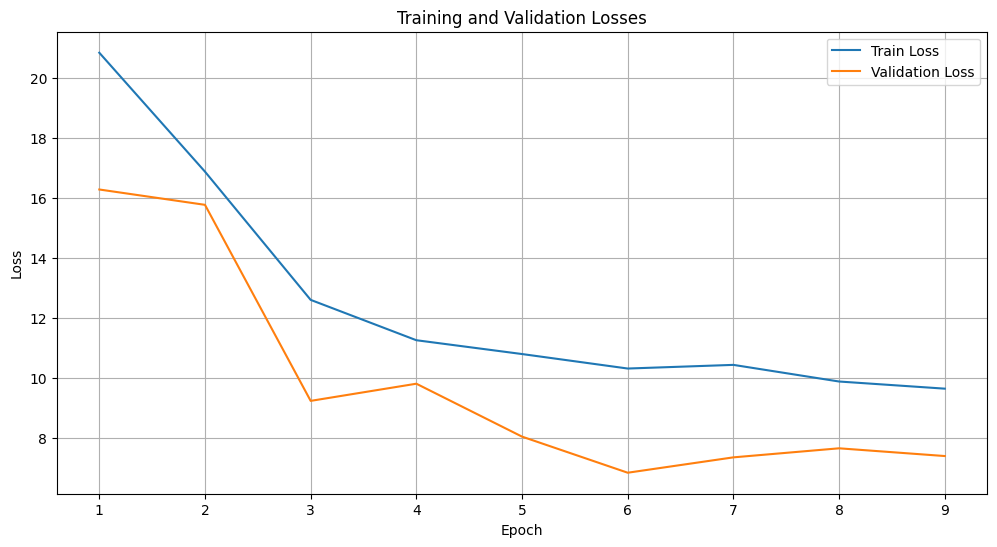

In [447]:
plot_losses(model_cls_reg_dropout.train_losses, model_cls_reg_dropout.val_losses)

- Generally, the model generalizes well and is able to predict age and gender descently. Though, there are some signs of overfitting, and the model struggles with age regression a bit more than with gender classification.

In [386]:
torch.save(model_cls_reg_dropout.state_dict(), 'model_cls_reg_dropout.pth')

with open('model_cls_reg_dropout.pkl', 'wb') as f:
    pickle.dump(model_cls_reg_dropout, f)

In [429]:
with open('model_cls_reg_dropout.pkl', 'rb') as f:
    age_gender_model = pickle.load(f)

In [434]:
summary(age_gender_model, input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

## 3.2. Testing the model

In [740]:
all_age_predictions = []
all_gender_predictions = []
all_true_ages = []
all_true_genders = []
all_images_normalized = []
all_images_transformed = []
all_images = []

not_normalized_transform = transforms.Compose([
    transforms.Normalize([-0.485/0.229, -0.456/0.224, -0.406/0.225],
                              [1/0.229, 1/0.224, 1/0.225]), 
])

with torch.no_grad():
    for images, (age_target, gender_target) in test_dataloader:
        gender_pred, age_pred = model_cls_reg_dropout(images)
        
        age_pred_np = age_pred.cpu().numpy()
        gender_pred_np = gender_pred.cpu().numpy()
        age_target_np = age_target.cpu().numpy()
        gender_target_np = gender_target.cpu().numpy()
        
        all_age_predictions.extend(age_pred_np)
        all_gender_predictions.extend(gender_pred_np)
        all_true_ages.extend(age_target_np)
        all_true_genders.extend(gender_target_np)
        
        for img in images:
            all_images_normalized.append(img)
            img_transformed = not_normalized_transform(img)  
            all_images_transformed.append(img_transformed)
            img_pil = transforms.ToPILImage(img_pil)
            all_images.append(img_pil)

### 3.2.1. Evaluating Age predictions

In [716]:
age_mae = mean_absolute_error(all_true_ages, all_age_predictions)
age_r2 = r2_score(all_true_ages, all_age_predictions)
age_mse = mean_squared_error(all_true_ages, all_age_predictions)
age_rmse = np.sqrt(age_mse)

print(f'Age MAE: {age_mae:.2f}')
print(f'Age R^2: {age_r2:.2f}')
print(f'Age MSE: {age_mse:.2f}')
print(f'Age RMSE: {age_rmse:.2f}')

Age MAE: 6.64
Age R^2: 0.86
Age MSE: 85.25
Age RMSE: 9.23


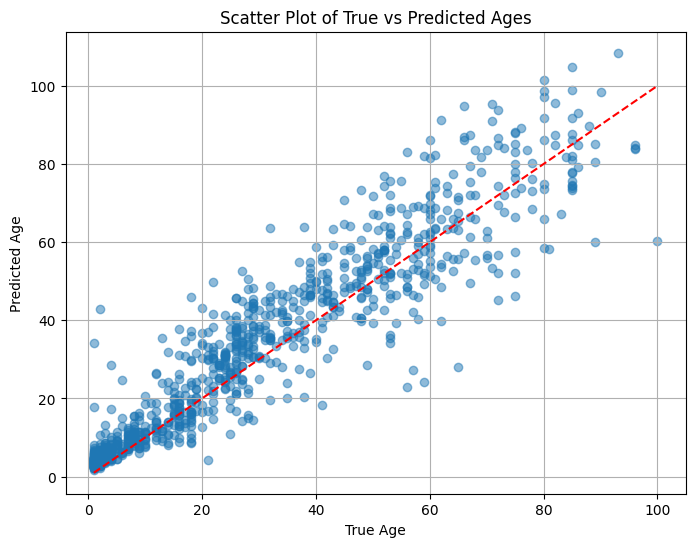

In [562]:
def plot_scatter(true_ages, predicted_ages):
    plt.figure(figsize=(8, 6))
    plt.scatter(true_ages, predicted_ages, alpha=0.5)
    plt.plot([min(true_ages), max(true_ages)], 
             [min(true_ages), max(true_ages)], '--', color='red')
    plt.xlabel('True Age')
    plt.ylabel('Predicted Age')
    plt.title('Scatter Plot of True vs Predicted Ages')
    plt.grid(True)
    plt.show()

plot_scatter(all_true_ages, all_age_predictions)

- The model is able to predict the true age well enough, though there are some extreme errors that we'll inspect further.

### 3.2.2. Evaluating Gender predictions

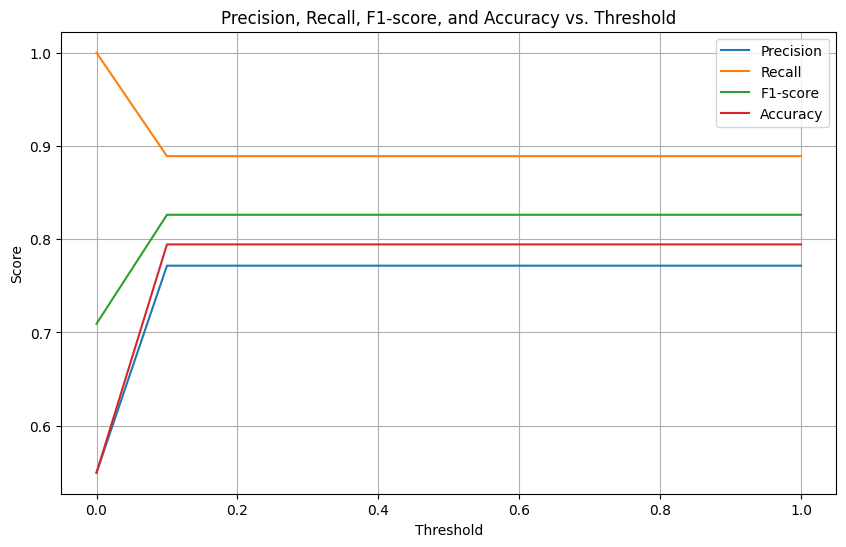

In [563]:
thresholds = np.linspace(0, 1, 11)
precisions = []
recalls = []
f1_scores = []
accuracies = []

for threshold in thresholds:
    y_pred = (gender_preds >= threshold).astype(int)
    precision = precision_score(all_true_genders, y_pred)
    recall = recall_score(all_true_genders, y_pred)
    f1 = f1_score(all_true_genders, y_pred)
    accuracy = accuracy_score(all_true_genders, y_pred)
    
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    accuracies.append(accuracy)

plt.figure(figsize=(10, 6))
plt.plot(thresholds, precisions, label='Precision')
plt.plot(thresholds, recalls, label='Recall')
plt.plot(thresholds, f1_scores, label='F1-score')
plt.plot(thresholds, accuracies, label='Accuracy')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Precision, Recall, F1-score, and Accuracy vs. Threshold')
plt.legend()
plt.grid(True)
plt.show()

In [564]:
gender_preds = (np.array(all_gender_predictions) > 0.5).astype(int)

In [715]:
gender_accuracy = accuracy_score(all_true_genders, gender_preds)
gender_f1 = f1_score(all_true_genders, gender_preds, average='weighted')
gender_precision = precision_score(all_true_genders, gender_preds)
gender_recall = recall_score(all_true_genders, gender_preds)
roc_auc = roc_auc_score(all_true_genders, gender_preds)

print(f'Gender Accuracy: {gender_accuracy:.2f}')
print(f'Gender F1-score: {gender_f1:.2f}')
print(f'Gender Precision: {gender_precision:.2f}')
print(f'Gender Recall: {gender_recall:.2f}')
print(f'Gender ROC-AUC Score: {roc_auc:.2f}')

Gender Accuracy: 0.79
Gender F1-score: 0.79
Gender Precision: 0.77
Gender Recall: 0.89
Gender ROC-AUC Score: 0.78


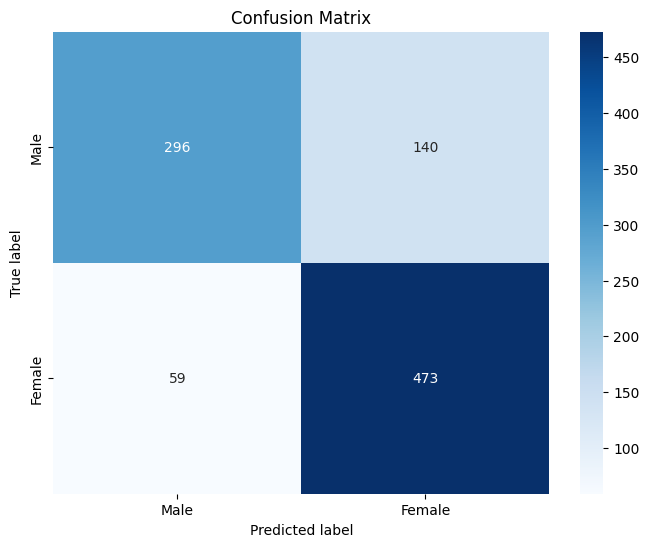


Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.68      0.75       436
           1       0.77      0.89      0.83       532

    accuracy                           0.79       968
   macro avg       0.80      0.78      0.79       968
weighted avg       0.80      0.79      0.79       968



In [566]:
conf_matrix = ConfusionMatrix(num_classes=2, task="binary")
cm = conf_matrix(torch.tensor(gender_preds).squeeze(-1), 
                 torch.tensor(all_true_genders))
class_labels = ['Male', 'Female']

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', 
            xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')
plt.show()

report = classification_report(torch.tensor(all_true_genders), 
                               torch.tensor(gender_preds).squeeze(-1))
print("\nClassification Report:")
print(report)

- The model is able to predict gender well enough, though it still need some improvement. We may need to balance the dataset more and make the model more robust.

### 3.2.3. Analyzing top mispredictions

In [567]:
all_true_ages_np = np.array(all_true_ages)
all_age_predictions_np = np.array(all_age_predictions)
absolute_errors = np.abs(all_true_ages_np - all_age_predictions_np)
top_mispredictions_indices = np.argsort(absolute_errors)[::-1]

In [602]:
all_true_ages_np = np.array(all_true_ages)
all_age_predictions_np = np.array(all_age_predictions).reshape(-1)  
absolute_errors = np.abs(all_true_ages_np - all_age_predictions_np)
top_mispredictions_indices = np.argsort(absolute_errors)[::-1][:50]
print("Indices of Top 50 Mispredictions based on MAE:", top_mispredictions_indices)

Indices of Top 50 Mispredictions based on MAE: [575 743 509 778 201 787 144 623 628 474 578 811 876 831 942 675  17 454
 520 677  14 646 527 574  10 671 442 663 944 479 813 386 396 113 670 878
 638 589 958 274 131 905 779 637 233 702 238 387  59 394]


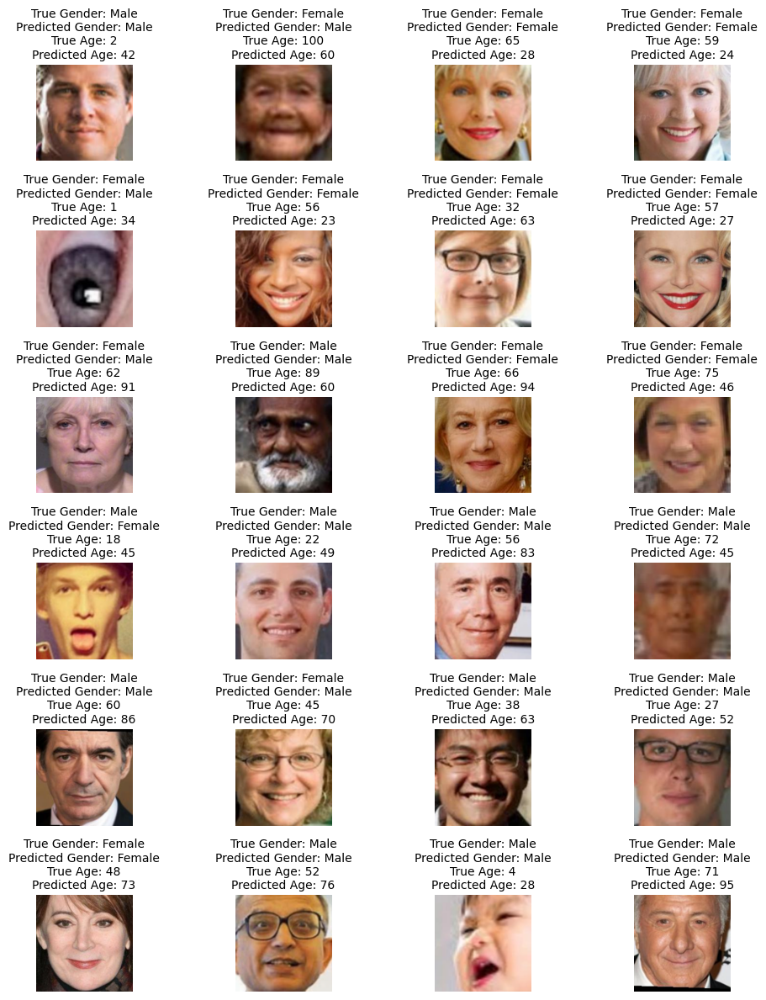

In [633]:
rows = 6
cols = 4
fig, axs = plt.subplots(rows, cols, figsize=(10, 12))

for i in range(24): 
    row = i // cols
    col = i % cols
    index = top_mispredictions_indices[i]
    image = all_images[index]  
    
    true_gender_label = gender_map[all_true_genders[index]]
    predicted_gender_value = 1 if all_gender_predictions[index][0] > 0.5 else 0  
    predicted_gender_label = "Male" if predicted_gender_value == 0 else "Female"  
    
    true_age = all_true_ages[index]
    predicted_age = int(all_age_predictions[index][0])  
    
    axs[row, col].imshow(image)
    axs[row, col].set_title(f"True Gender: {true_gender_label}\nPredicted Gender: {predicted_gender_label}\nTrue Age: {true_age}\nPredicted Age: {predicted_age}", fontsize=10)  # Add true and predicted labels with smaller font size
    axs[row, col].axis('off')  

plt.tight_layout()  
plt.show()

- Some of the top misclassified images are invalid (like the picture of an adult man with label "2y.o", or the close-up image of an eye).
- The model seems to assign older age to people with glasses. To tackle this we could improve the structure of our model, and/or improve the dataset.

In [581]:
gender_preds_tensor = torch.tensor(gender_preds).squeeze(-1)
all_true_genders_tensor = torch.tensor(all_true_genders)
misclassifications = (gender_preds_tensor != all_true_genders_tensor)
misclassification_indices = torch.nonzero(misclassifications).squeeze()
print("Indices of Misclassifications:", misclassification_indices.tolist())

Indices of Misclassifications: [1, 5, 11, 21, 22, 26, 38, 40, 44, 47, 52, 58, 59, 62, 64, 70, 71, 72, 75, 81, 82, 95, 97, 101, 109, 117, 125, 131, 132, 138, 139, 142, 147, 148, 152, 157, 159, 161, 163, 169, 173, 175, 179, 180, 191, 201, 204, 216, 217, 220, 222, 229, 230, 251, 254, 255, 257, 258, 274, 275, 281, 287, 288, 292, 293, 294, 296, 297, 301, 307, 309, 312, 320, 321, 323, 324, 328, 336, 337, 340, 342, 345, 346, 350, 357, 360, 361, 362, 366, 367, 369, 370, 372, 382, 383, 385, 386, 390, 403, 407, 411, 412, 415, 416, 418, 423, 426, 428, 429, 430, 444, 445, 451, 454, 457, 463, 478, 485, 488, 493, 496, 500, 503, 507, 514, 517, 518, 522, 524, 528, 533, 540, 551, 554, 565, 571, 584, 595, 597, 603, 610, 614, 625, 627, 628, 647, 650, 655, 661, 663, 667, 684, 685, 688, 698, 713, 715, 723, 725, 729, 735, 743, 755, 759, 768, 770, 775, 777, 781, 784, 788, 793, 803, 806, 807, 808, 813, 820, 821, 838, 842, 863, 866, 876, 886, 891, 903, 911, 914, 919, 920, 923, 933, 938, 943, 951, 956, 960, 963

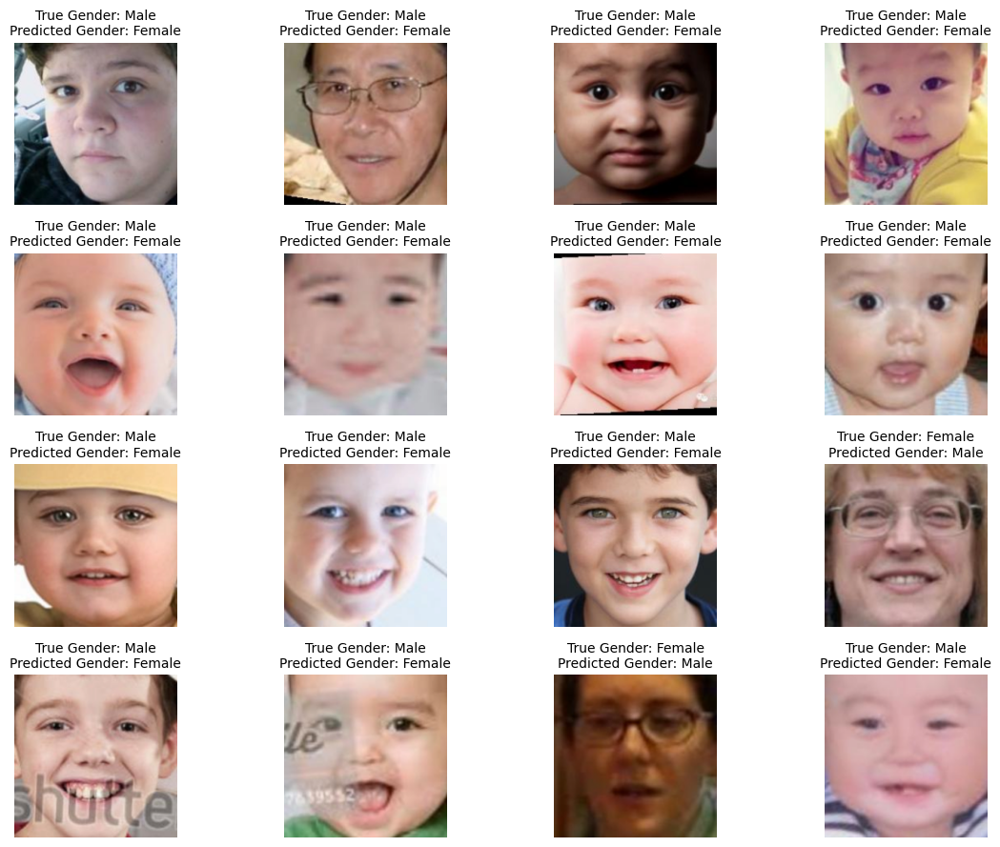

In [637]:
random_misclassification_indices = random.sample(misclassification_indices.tolist(), 16)

fig, axs = plt.subplots(4, 4, figsize=(12, 9))

for i, index in enumerate(random_misclassification_indices):
    row = i // 4
    col = i % 4
    
    image = all_images[index]
    true_gender_label = gender_map[all_true_genders[index]]
    predicted_gender_value = 1 if all_gender_predictions[index][0] > 0.5 else 0
    predicted_gender_label = "Male" if predicted_gender_value == 0 else "Female"
    
    axs[row, col].imshow(image)
    axs[row, col].set_title(f"True Gender: {true_gender_label}\nPredicted Gender: {predicted_gender_label}", fontsize=10)
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

- We can observe that in most cases gender is assigned wrongly to babies.

In [638]:
double_mispredictions = [index for index in top_mispredictions_indices if index in misclassification_indices]
double_mispredictions

[743, 201, 628, 876, 454, 663, 813, 386, 274, 131, 59]

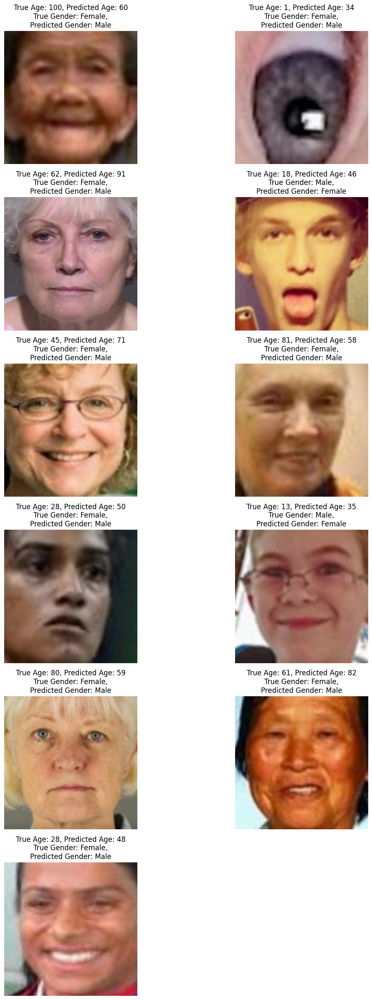

In [650]:
def plot_images_with_labels(indices, all_images, all_true_ages, all_age_predictions, all_true_genders, gender_map):
    num_images = len(indices)
    num_rows = num_images // 2 if num_images % 2 == 0 else num_images // 2 + 1
    
    plt.figure(figsize=(12, 4 * num_rows))
    for i, index in enumerate(indices, start=1):
        image = all_images[index]
        
        true_age = int(all_true_ages[index])
        predicted_age = int(round(all_age_predictions[index][0]))
        
        true_gender = gender_map[int(all_true_genders[index])]
        predicted_gender = gender_map[int(round(all_gender_predictions[index][0]))]
        
        plt.subplot(num_rows, 2, i)
        plt.imshow(image)
        plt.title(f"True Age: {true_age}, " 
                  + f"Predicted Age: {predicted_age}\nTrue Gender: {true_gender}," 
                  + f"\nPredicted Gender: {predicted_gender}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

plot_images_with_labels(double_mispredictions, all_images, all_true_ages, 
                        all_age_predictions, all_true_genders, gender_map)

### 3.2.4. Analyzing the model with LIME

In [827]:
test_dataset = CustomDataset(X_test['Image_Path'], y_test['Ages'], 
                             y_test['Genders'], transform=val_transform)
test_dataloader = DataLoader(test_dataset, batch_size=1)

model = model_cls_reg_dropout
model.eval()

MultiTaskModel(
  (feature_extractor): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affin

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

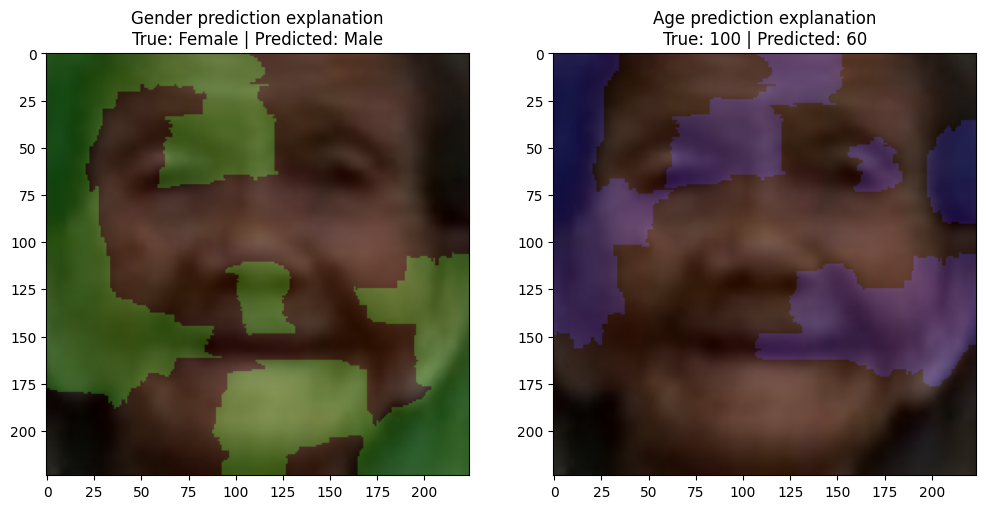

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

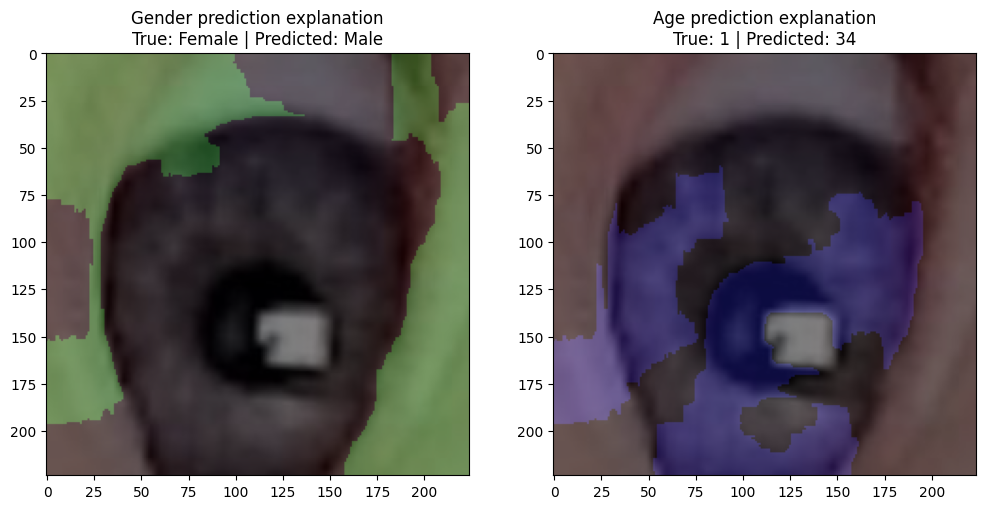

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

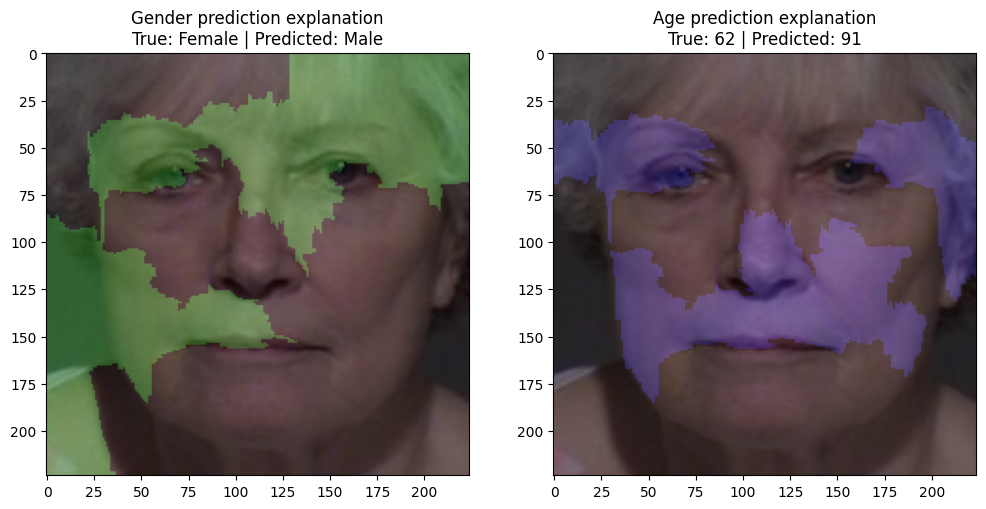

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

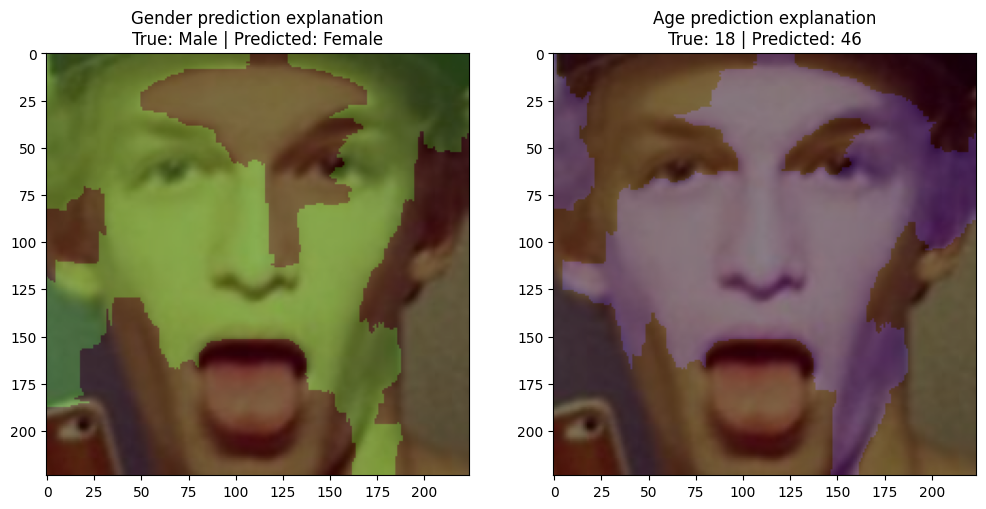

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

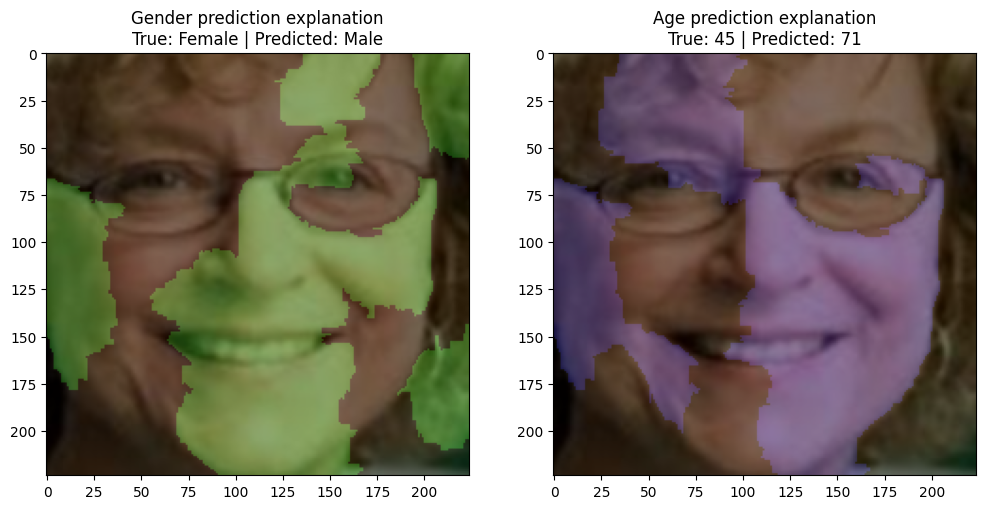

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

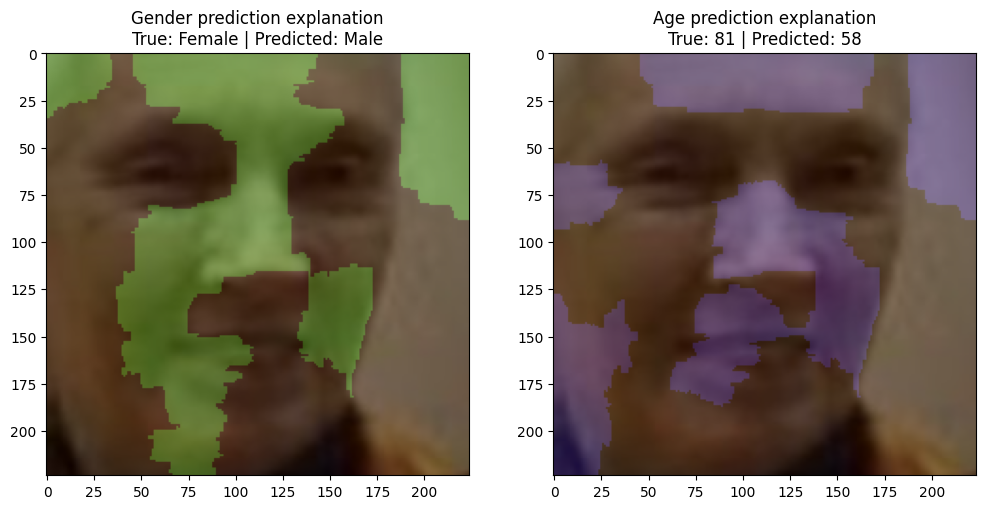

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

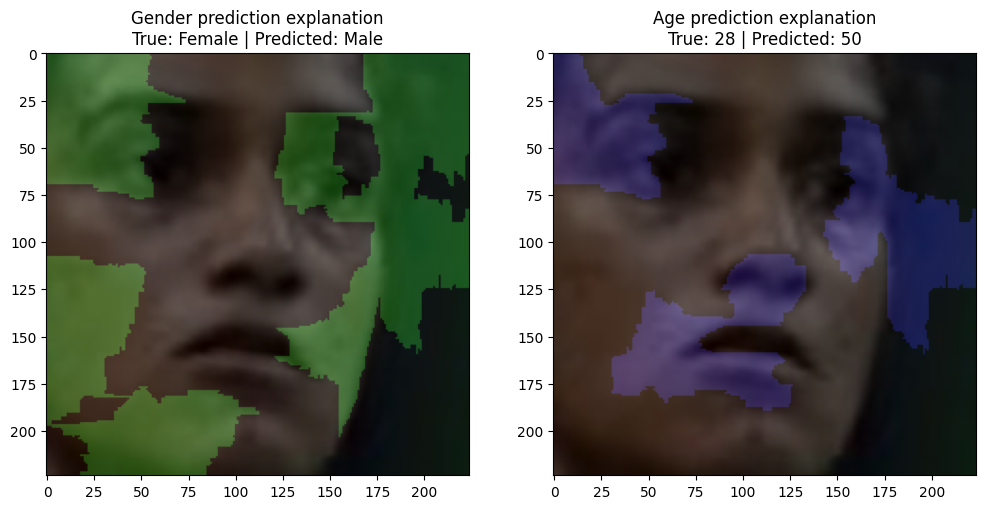

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

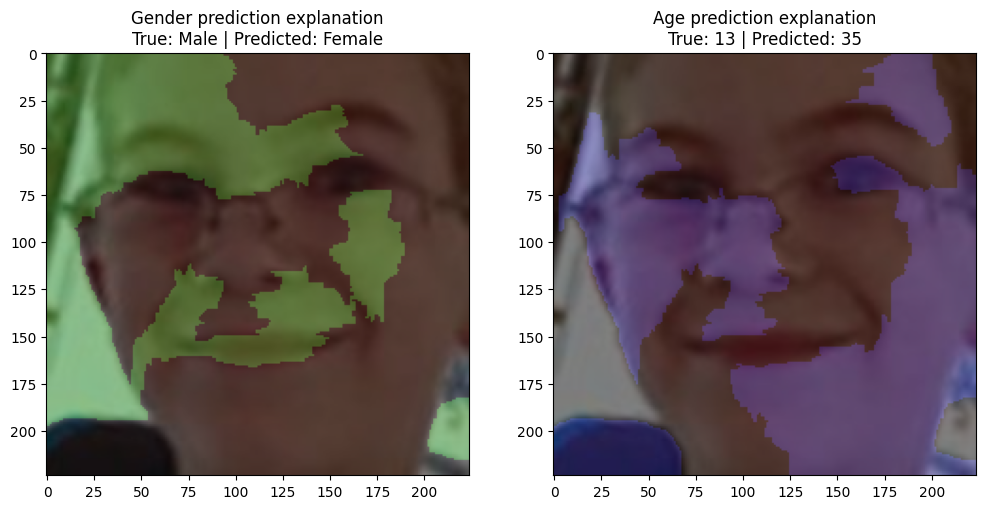

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

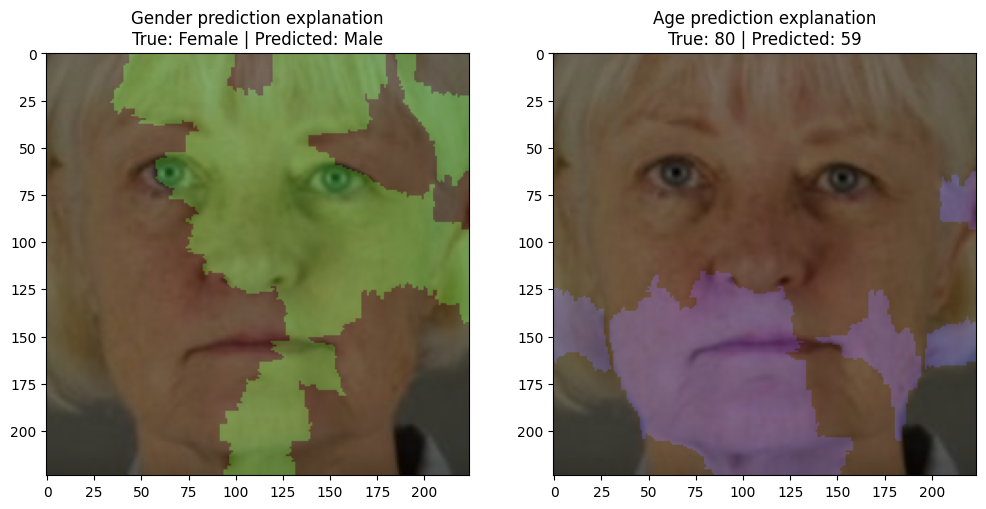

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

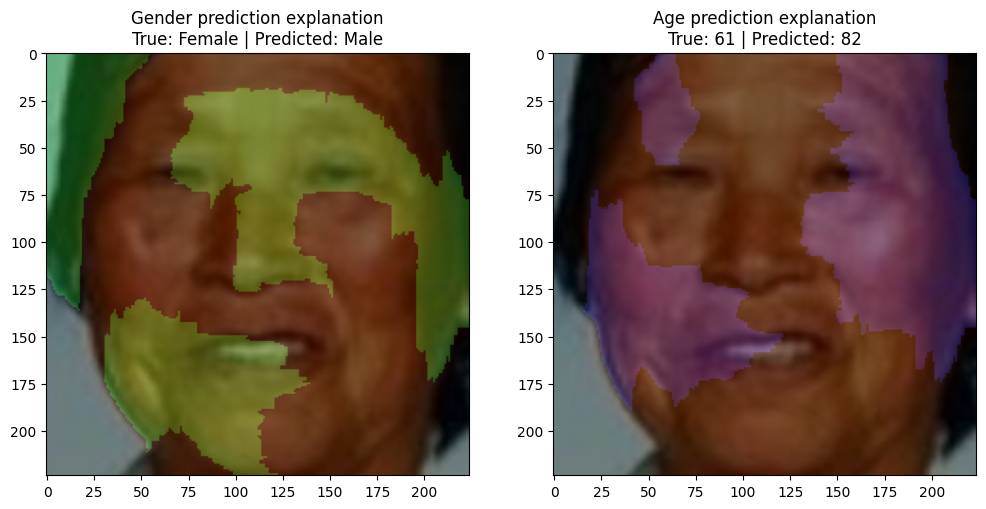

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

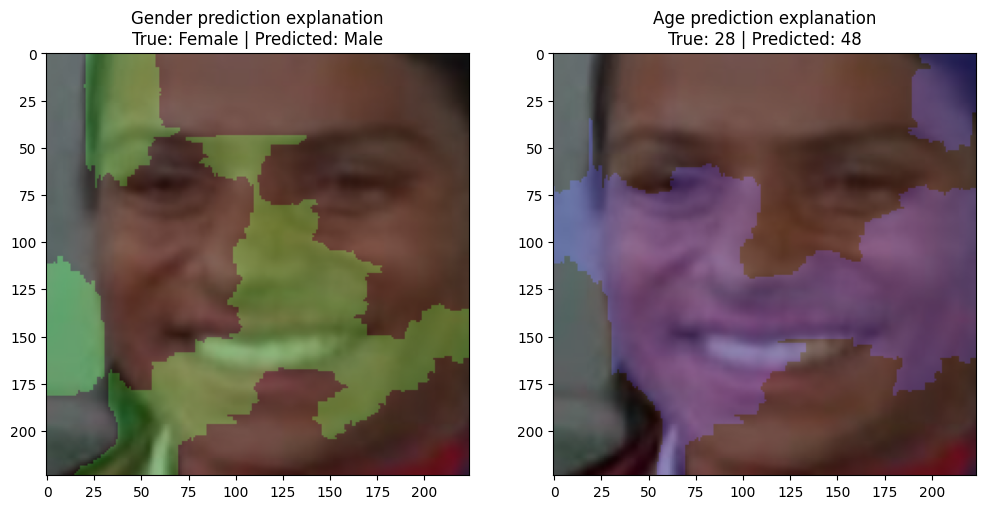

In [881]:
def generate_lime_explanations(model, test_dataloader, idx_list):
    explainer = lime_image.LimeImageExplainer()

    denormalize = transforms.Normalize((-0.485/0.229, -0.456/0.224, -0.406/0.225), 
                                       (1/0.229, 1/0.224, 1/0.225))

    for idx in idx_list:
        image, labels = test_dataloader.dataset[idx]
        image = image.unsqueeze(0)  

        image = image.permute(0, 2, 3, 1)  
        input_tensor = image.permute(0, 3, 1, 2)  

        gender_pred, age_pred = model(input_tensor)

        gender_pred_single = int(torch.round(gender_pred[0]).item())
        age_pred_single = int(torch.round(age_pred[0]).item())

        denorm_image = denormalize(image[0].permute(2, 0, 1)).permute(1, 2, 0)

        gender_explanation = explainer.explain_instance(denorm_image.numpy(),
                                                        lambda x: model(torch.from_numpy(x).permute(0, 3, 1, 2))[0].detach().cpu().numpy(),
                                                        top_labels=2, hide_color=None, num_samples=1000)
        temp_gender, mask_gender = gender_explanation.get_image_and_mask(gender_explanation.top_labels[0], 
                                                                         positive_only=True, num_features=10, 
                                                                         hide_rest=False)

        age_explanation = explainer.explain_instance(denorm_image.numpy(),
                                                    lambda x: model(torch.from_numpy(x).permute(0, 3, 1, 2))[1].detach().cpu().numpy(),
                                                    top_labels=2, hide_color=None, num_samples=1000)
        temp_age, mask_age = age_explanation.get_image_and_mask(age_explanation.top_labels[0], 
                                                                positive_only=True, num_features=10, 
                                                                hide_rest=False)

        plt.figure(figsize=(12, 6))
        
        plt.subplot(1, 2, 1)
        plt.imshow(denorm_image)
        gender_mask = np.stack((mask_gender * 0.1, mask_gender * 0.5, mask_gender * 0.1), axis=2)  
        plt.imshow(denorm_image, alpha=0.5)
        plt.imshow(gender_mask, alpha=0.5)  
        gender_label = "Female" if gender_pred_single == 1 else "Male"
        true_gender_label = "Female" if int(labels[1].item()) == 1 else "Male"
        plt.title("Gender prediction explanation\nTrue: {} | Predicted: {}".format(true_gender_label, 
                                                                                   gender_label))
        
        plt.subplot(1, 2, 2)
        plt.imshow(denorm_image)
        age_mask = np.stack((mask_age * 0.1, mask_age * 0.1, mask_age * 0.5), axis=2) 
        plt.imshow(denorm_image, alpha=0.5)
        plt.imshow(age_mask, alpha=0.5)  
        plt.title("Age prediction explanation\nTrue: {} | Predicted: {}".format(int(labels[0].item()), 
                                                                                age_pred_single))
        
        plt.show()

#### Plotting LIME Explainer mask for random images

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

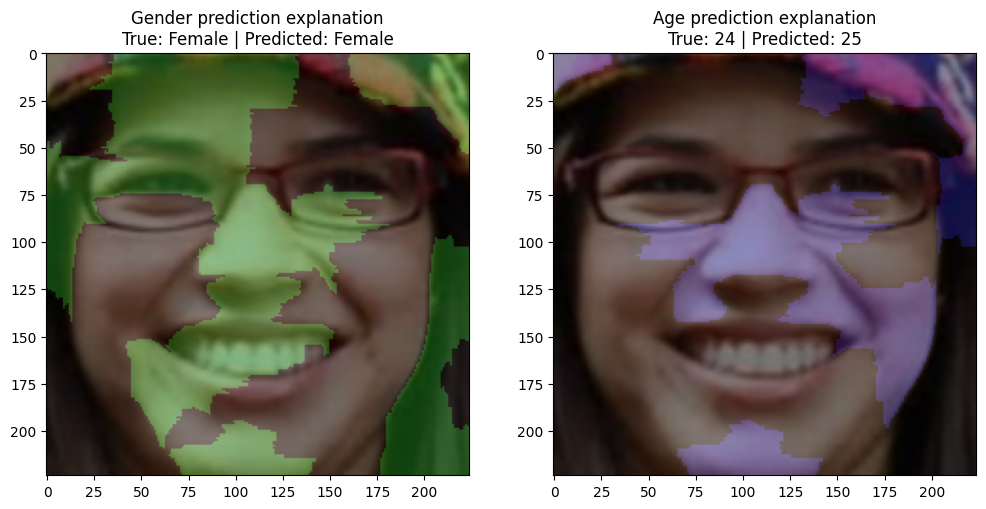

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

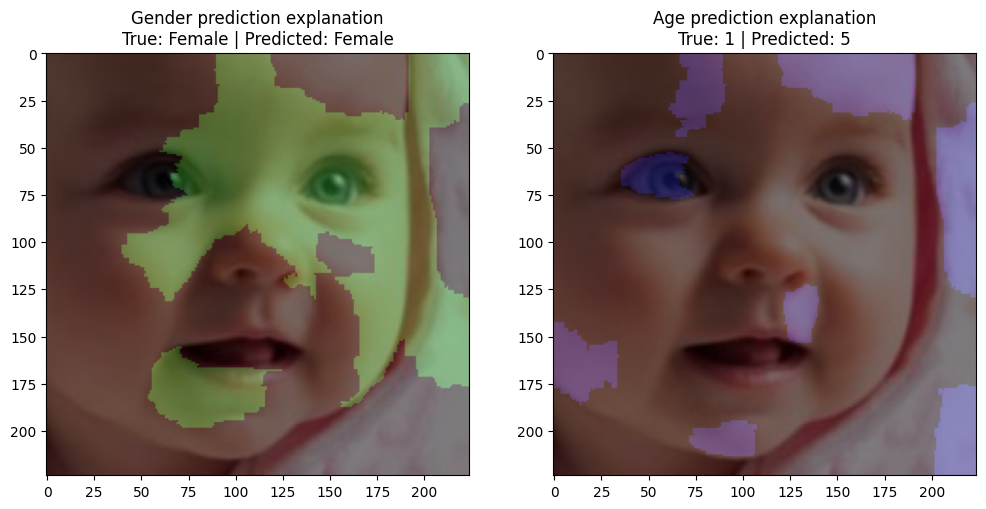

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

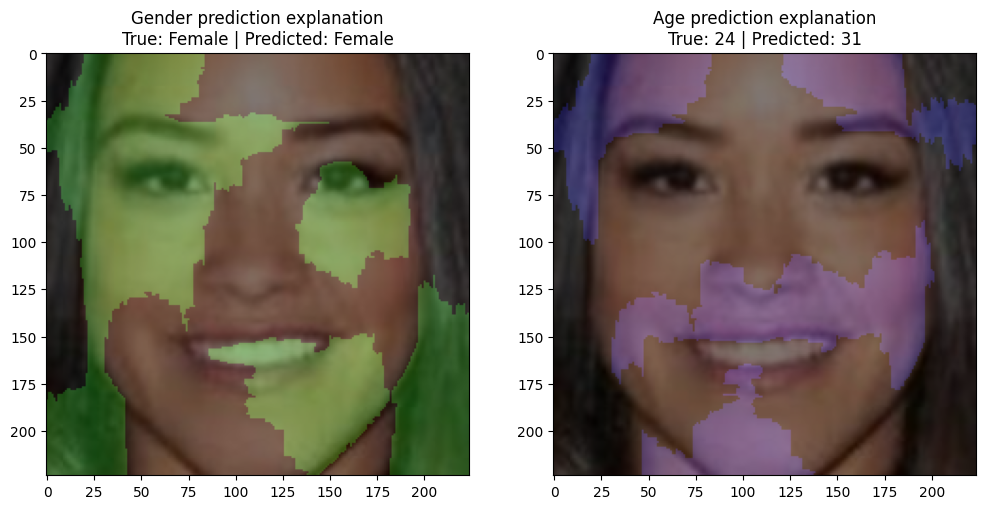

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

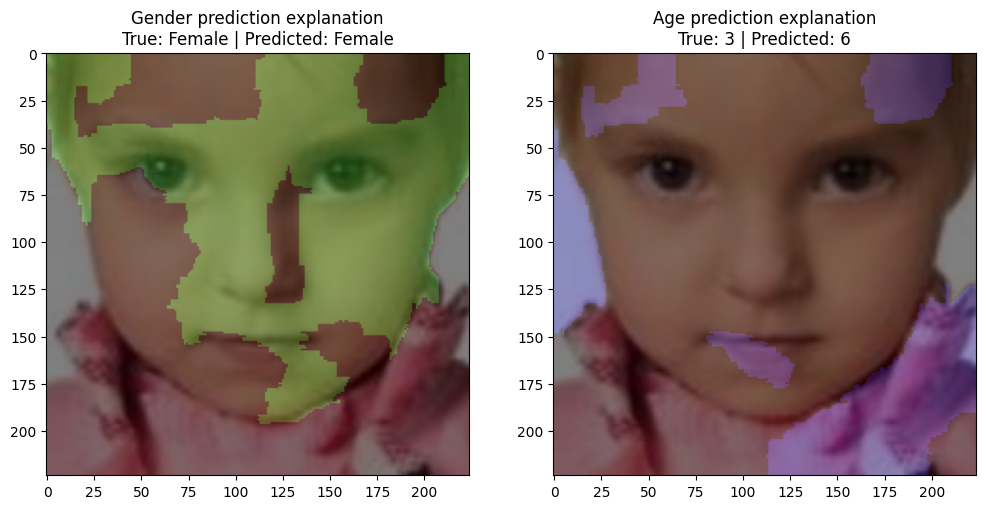

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

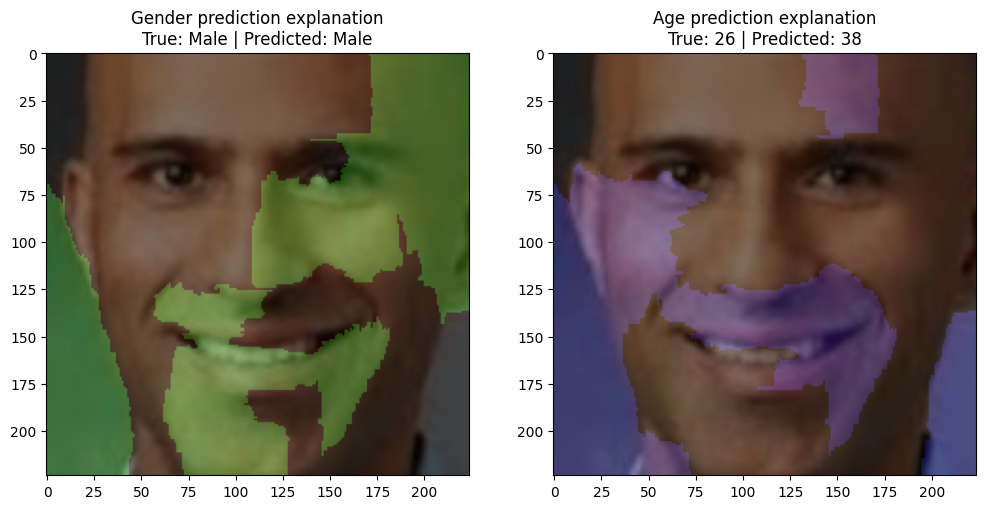

In [883]:
all_indices = list(range(len(test_dataset)))
indices_to_include = [idx for idx in all_indices if idx not in double_mispredictions]
random_indices = random.sample(indices_to_include, k=5)
generate_lime_explanations(model, test_dataloader, random_indices)

#### Plotting LIME Explainer mask for top mispredictions

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

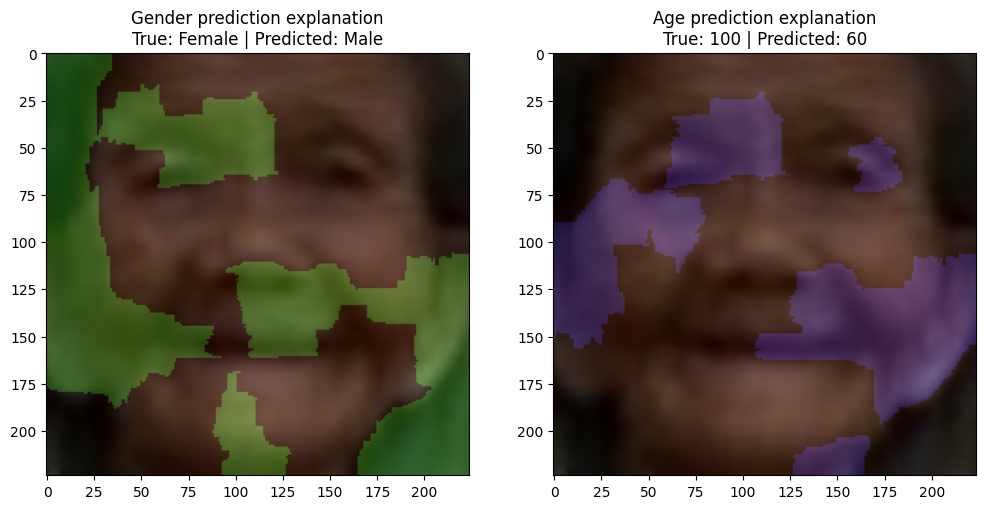

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

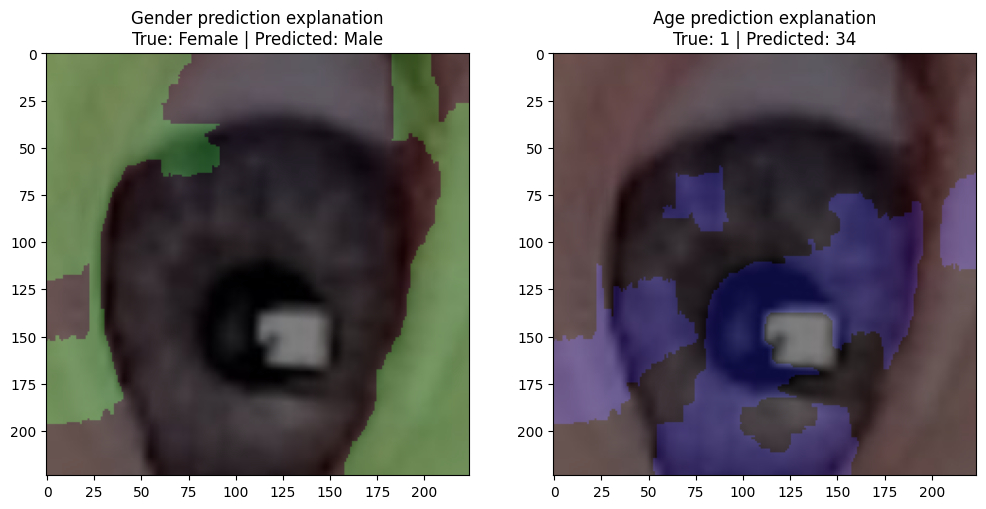

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

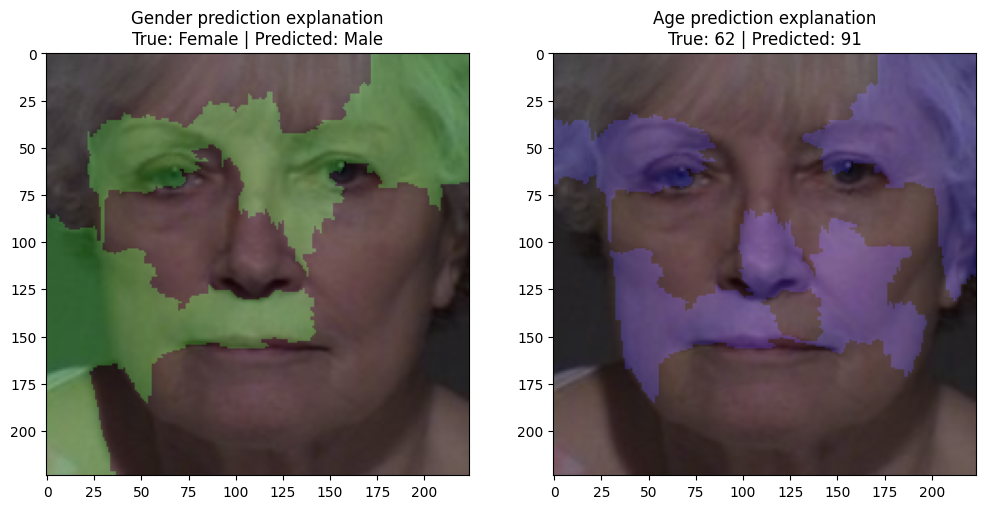

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

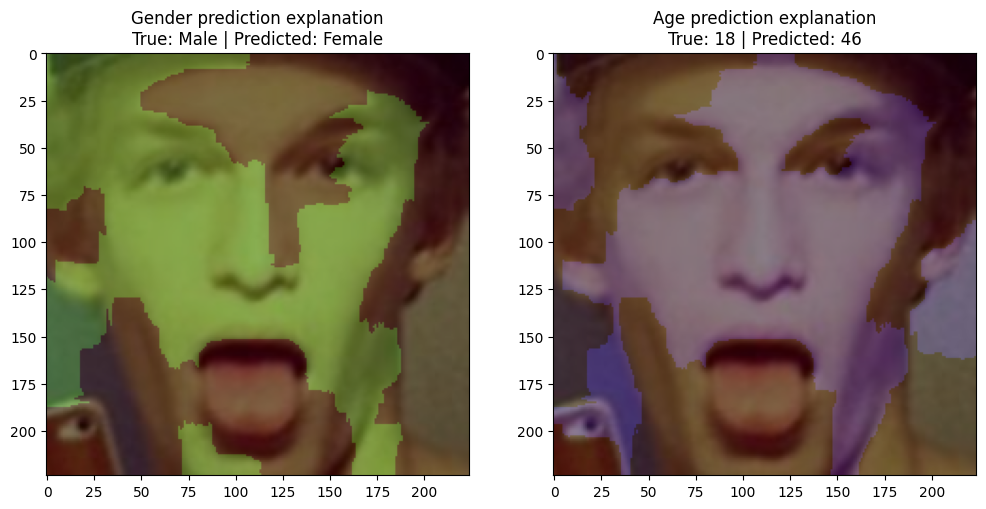

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

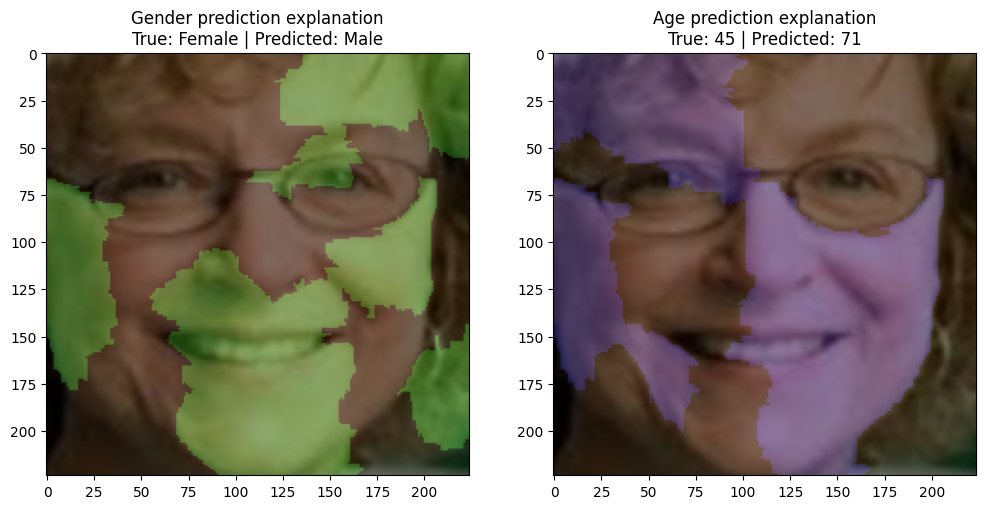

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

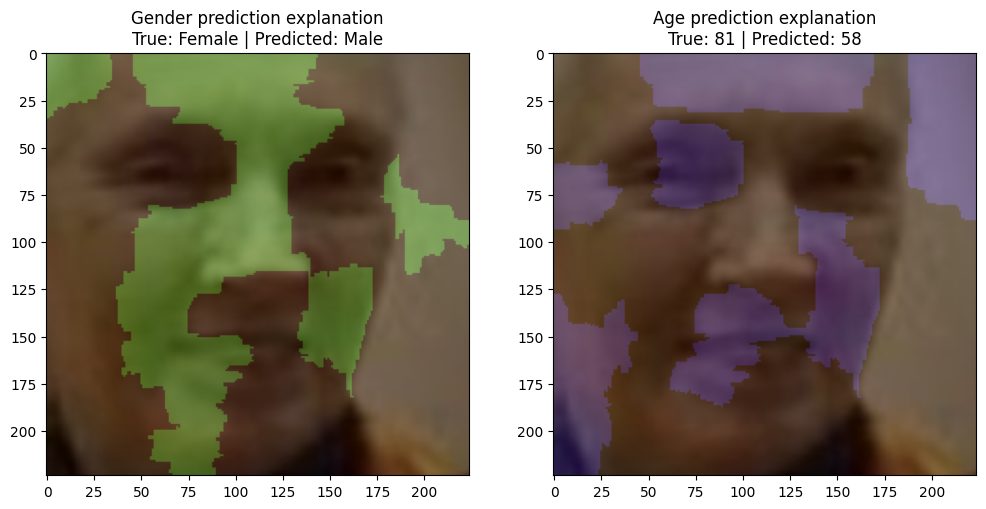

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

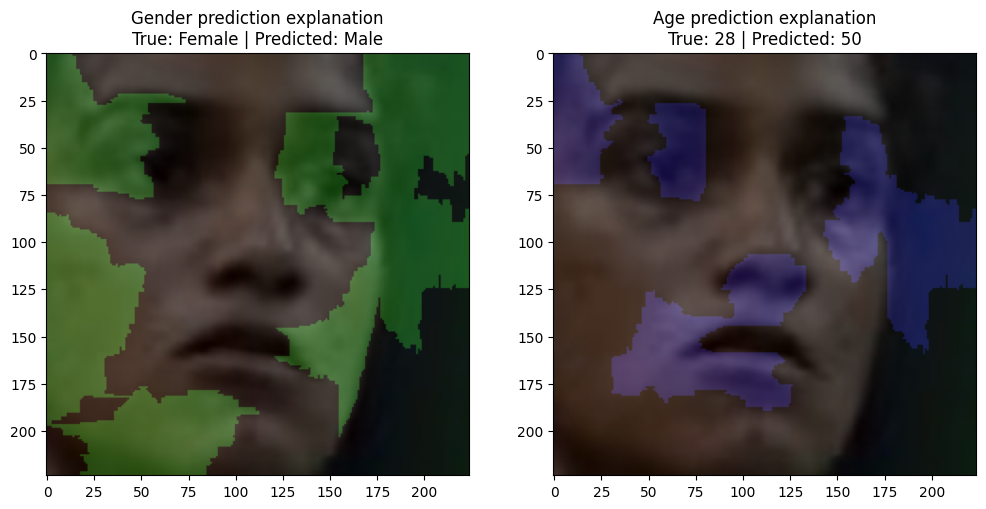

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

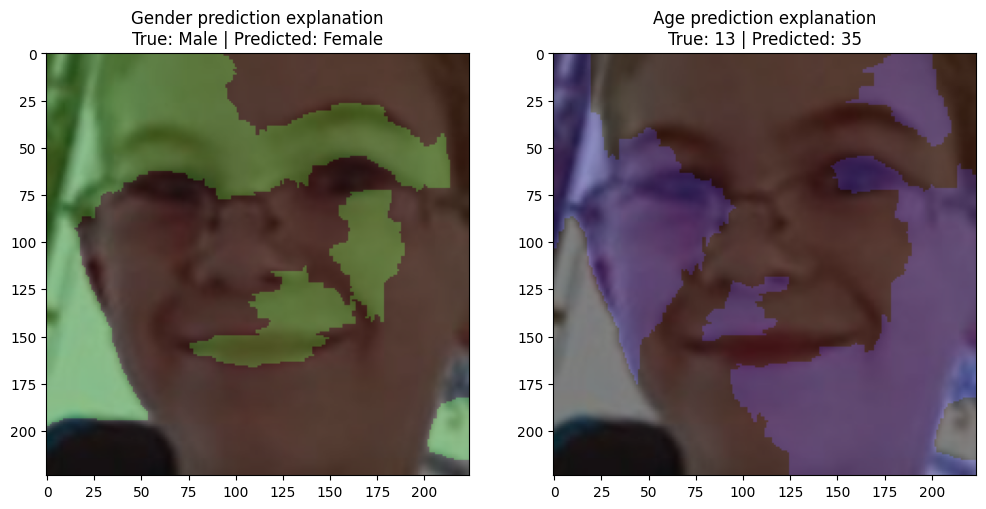

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

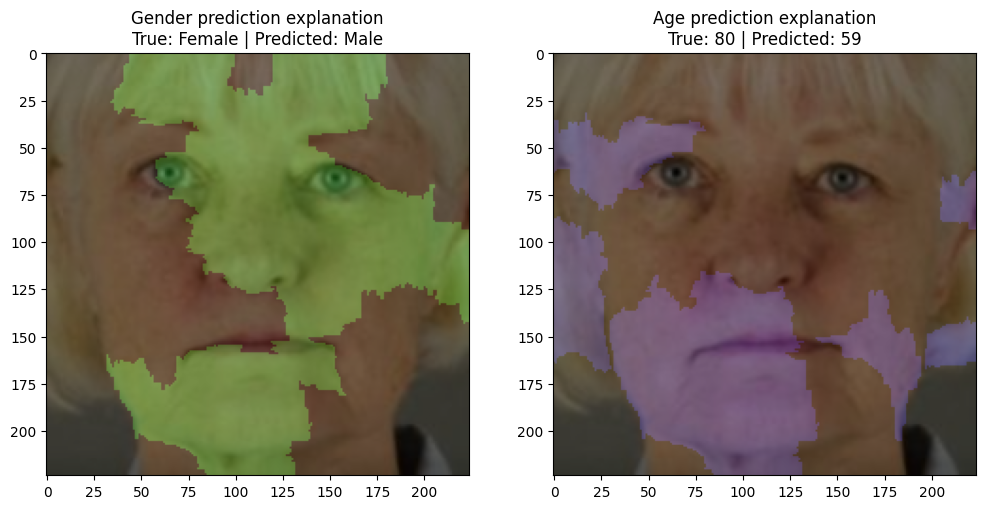

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

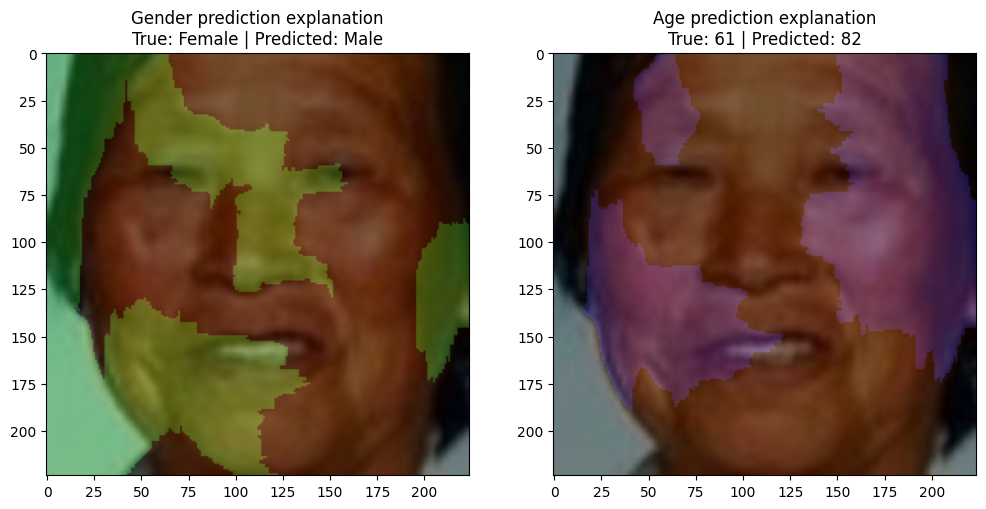

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

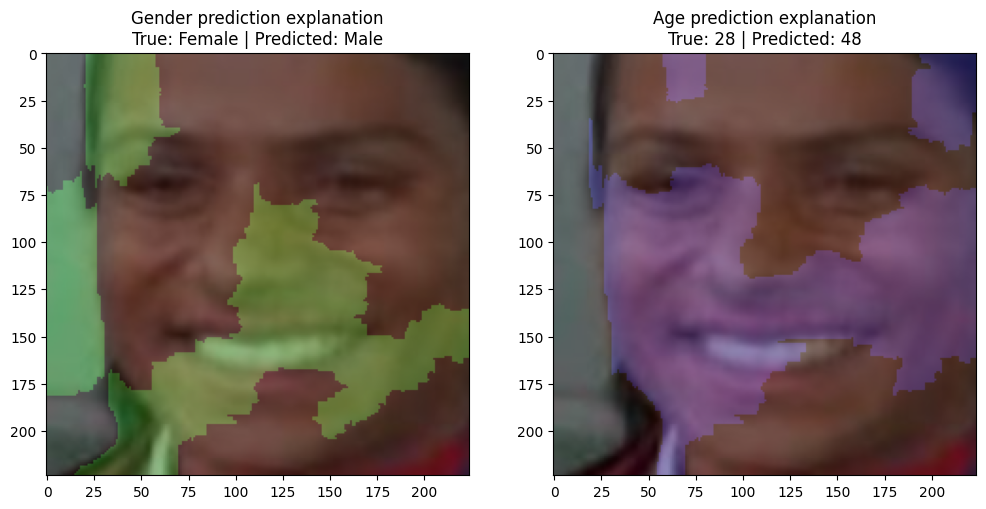

In [884]:
generate_lime_explanations(model, test_dataloader, double_mispredictions)

- LIME Explainer desn't highlight anything unusual. Our mode seems to look at general face features to detect the gender and age.

# 4. Conclusions and further improvement

## Observations: 
- The dataset contains images of faces of various genders, ages, and races. We've preprocessed the dataset by removing black&white images and normalizing.
- We have utilized data augmentation, transfer learning with the pretrained model ResNet18, and regularization to get a moderately good result. The optimized model is able to predict age and gender of images fairly well, though the results can and should be improved.
- Among the top mispredicted images, we can observe the pattern of assigning older age to people with glasses, and assigning a wrong gender to babies.

## Usage scenarios:
- This model can be used in various domains for different goals, such as:
    - improving personalized healthcare services;
    - implementing social services tailored to specific age and gender groups;
    - enhancing user experience through more personalized content;
    - providing higher security and access control;
    - implementing targeted educational initiatives, etc.
- Note: The model should not be used for discriminative or harmful purposes.

## Further improvement:
- The model performance can be improved by improving its architecture, changing the feature extractor, introducing class weights and/or improving the class balance in the dataset.
- In further work it would be useful to train the model on a full dataset to make it more robust and inclusive.
- We could also perform a more extensive EDA and data preprocessing, e.g. handling duplicates and invalid images/labels. 